# Objectif 

Date de création : 05/05/2026

Illustration de la structure du module des RTFs dans le plan (f, r)

## Cadre de l'étude 

Le guide d'onde étudié est un guide d'onde idéal avec fond parfaitement rigide aux dimensions approximative de l'environnement de la Groix. 

* Profondeur : $D = 30$ m.
* Antenne HLA de deux capteurs, immersion fixe 1 mètre au-dessus du fond $z_a = 29$ m.
* Source d'immersion fixe $z_s = 5$ m, distance au capteur de référence r variable. 
* Environnement : guide d'onde idéal (fond parfaitement solide). 

## Rappel formulation modale 

On pose 
$$
    Q =  \frac{e^{i3\pi/4}}{\rho(z_s) \sqrt{8 \pi}}
$$

et

$$
    A_m(z) = \Psi_m(z_{s}) \Psi_m(z) \frac{1}{\sqrt{k_{rm}}}
$$

La fonction de transfert du guide d'onde s'écrit,

$$
    H(f, r, z) = \frac{Q}{\sqrt{r}} \sum_{m=1}^{\infty} A_m(z) e^{-ik_{rm}
    r}
$$

En particulier, la fonction de transfert du canal de propagation associée au récepteur $j$ est :

$$
    H_{j} = \frac{Q}{\sqrt{r_j}} \sum_{m=1}^{\infty} A_m(z_j) e^{-ik_{rm}
    r_{j}}
$$

on s'intéresse au vecteur de RTF défini par

$$
    \mathbf{\Pi} \overset{\Delta}{=}
    \left [ \frac{H_{1}}{H_{1}} \, \frac{H_{2}}{H_{1}} \, \dots \, \frac{H_{M}}{H_{1}} \right ]^T
    = \frac{1}{H_{1}} \mathbf{H}
$$

Ici, il n'y a que deux capteurs et on s'intéresse simplement au rapport :

$$
    \Pi_2 = \frac{H_2}{H_1}
$$

**Conditions aux limites (cas parfaitement solide -> perfectly_rigid)**

Pression nulle en surface et au fond :
$$
p(r, z=0) = 0 \quad \text{et} \quad \frac{\partial p(r, z)}{\partial z} \rvert_{z=D} = 0 
$$

et les fonctions modales s'écrivent 

$$
\Psi_m(z) = \sqrt{\frac{2 \rho}{D}} \sin(k_{zm} z)
$$

Les fonctions $\Psi_m$ sont les fonctions propres associées aux valeurs propres $k_{rm}$,

$$
    k_{rm} = \sqrt{ k^2 - k_{zm}^2}
$$

avec, 

$$ 
    k_{zm} =  (m - \frac{1}{2}) \frac{\pi}{D}, \quad m \in \mathbb{N}^{*} .
$$

Le nombre $M$ de modes propagatifs (i.e correspondant à des k_{rm} réels) est donné par :

$$
    M = \left \lfloor \frac{\omega D}{c \pi} + \frac{1}{2}\right \rfloor
$$


In [1]:
# %matplotlib ipympl

import os
import sys
import numpy as np
import xarray as xr
import scipy.signal as sp
import matplotlib.pyplot as plt

from scipy.fft import rfft, rfftfreq
from scipy.signal import find_peaks


sys.path.append(r"C:\Users\baptiste.menetrier\Desktop\devPy\phd")

# from misc import mult_along_axis
from real_data_analysis.fiberscope_groix.src.localisation.rtf.sensibility.simu.sensi_simu_utils import (
    run_full_study,
    compute_rtf_dataset,
    plot_intensity,
    plot_tl_pi_frequency_range_plan,
    get_dist
)

# from propa.rtf.rtf_utils import D_hermitian_angle_fast
import source.global_constants as g
from publication.publication_figure import (
    PubFigure,
    LargeFigure,
    SmallFigure,
    color,
    set_subfigures_abc_labels,
)

In [2]:
root_img = r"C:\Users\baptiste.menetrier\Desktop\devPy\phd\real_data_analysis\fiberscope_groix\img\illustration\interference_structure"

# Définition du guide d'onde 

On considère la gamme de fréquence étudiée en actif [400, 800] Hz. La distance inter-capteurs est fixée à 950 m correspondant approximativement à la distance entre OBS 3 et OBS 2. 
La position de la source varie de 5 à 995 m (par rapport au capteur 1, cf schéma).  

In [3]:
bottom_bc = "perfectly_rigid"
# bottom_bc = "pressure_release"
waveguide_depth = 30
d_inter_rcv = 950
z_rcv = 29
# src_ref_range = 1.15 * 1e3
src_ref_range = 0.5 * 1e3
z_src = 5
nrgrid = 2001
# delta_r = 250
delta_r = 495
fmin = 400
fmax = 800
nfgrid = 500

In [4]:
omega_max = 2 * np.pi * fmax
c = 1500
M = np.floor((omega_max*waveguide_depth/(np.pi*c)) + 1/2).astype(int)
print("Nombre maximal de modes propagatifs M = ", M)

Nombre maximal de modes propagatifs M =  32


# Illsutration des propriétés du guide d'onde 

## Cas M = 2

On considère dans un premier temps le cas simple où l'on ne considère que les deux premiers modes propagatifs. 

In [5]:
distances=["hermitian_angle"]

ds = run_full_study(
    bottom_bc=bottom_bc,
    waveguide_depth=waveguide_depth,
    d_inter_rcv=d_inter_rcv,
    z_rcv=z_rcv,
    src_ref_range=src_ref_range,
    z_src=z_src,
    nrgrid=nrgrid,
    delta_r=delta_r,
    fmin=fmin,
    fmax=fmax,
    nfgrid=nfgrid,
    root_img=root_img,
    distances=distances,
    n_modes=2,
)

Number of propagating modes at fmin = 400 Hz : 16
Number of propagating modes at fmax = 800 Hz : 32
Computing RTF using  M = 2 modes (instead of all the propagating modes which are 32 at fmax)


Dataset computed


In [6]:
ds

<xarray.Dataset> Size: 48MB
Dimensions:   (f: 500, r: 2001, h_index: 2)
Coordinates:
  * f         (f) float64 4kB 400.0 400.8 401.6 402.4 ... 798.4 799.2 800.0
  * r         (r) float64 16kB 5.0 5.495 5.99 6.485 ... 993.5 994.0 994.5 995.0
  * h_index   (h_index) int32 8B 1 2
Data variables:
    H1        (f, r) complex64 8MB (-0.0019273945-0.000634224j) ... (5.026190...
    H2        (f, r) complex64 8MB (-6.934516e-05+0.00012934924j) ... (-2.682...
    data      (h_index, f, r) complex64 16MB (1+0j) ... (0.27133927-0.1887774j)
    phase     (h_index, f, r) float32 8MB 0.0 0.0 0.0 ... -0.6092 -0.6079
    module    (h_index, f, r) float32 8MB 1.0 1.0 1.0 ... 0.3304 0.3305 0.3305
    data_ref  (h_index, f) complex64 8kB (1+0j) ... (0.100176476-0.559328j)
    nb_modes  (f) int32 2kB 16 16 16 16 16 16 16 16 ... 32 32 32 32 32 32 32 32
Attributes:
    description:      RTF dataset for an ideal waveguide. The antenna is comp...
    bottom_bc:        perfectly_rigid
    waveguide_depth:  30
    z_s:              5
    z_a:              29
    r_ref:            500.0
    d12:              950
    h_index_ref:      1

### Allure des fonctions de transfert et du rapport 

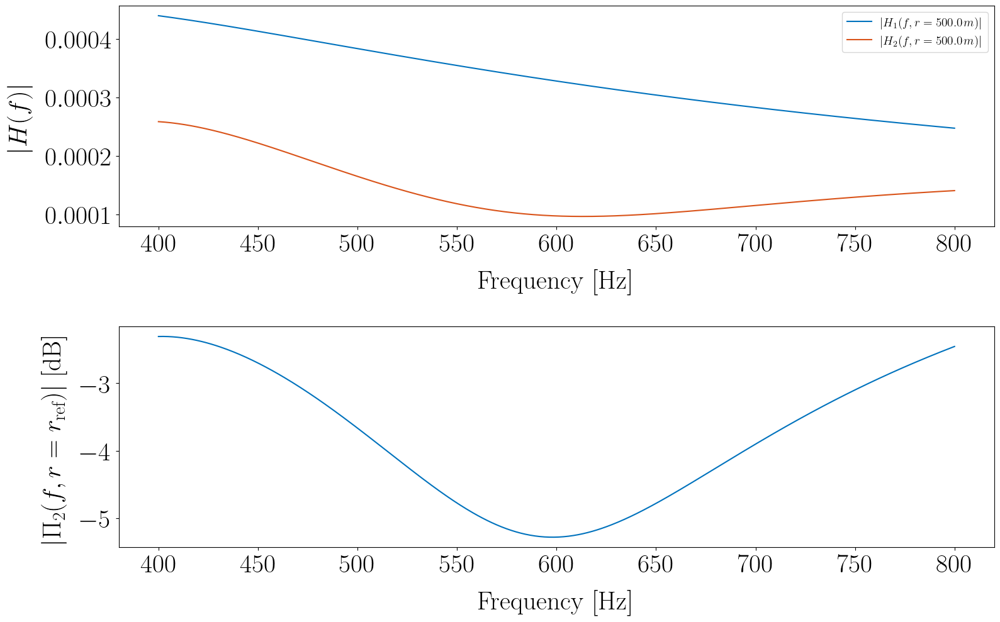

In [7]:
tf1_mod = np.abs(ds.H1)
tf2_mod = np.abs(ds.H2)


fig, axs= plt.subplots(2, 1, figsize=(16, 10))

tf1_mod.sel(r=ds.r_ref, method="nearest").plot(label=fr"$\lvert H_1 (f, r={{{ds.r_ref}}}m) \rvert$", color=color(0), ax=axs[0])
tf2_mod.sel(r=ds.r_ref, method="nearest").plot(label=fr"$\lvert H_2 (f, r={{{ds.r_ref}}}m) \rvert$", color=color(1), ax=axs[0])
axs[0].set_ylabel(r"$\lvert H(f) \rvert$")
axs[0].legend()
axs[0].set_title("")


rtf2_mod = ds.module.sel(h_index=2)
rtf2_mod_log = 10 * np.log10(rtf2_mod)

rtf2_mod_log.sel(r=ds.r_ref, method="nearest").plot(
    label=rf"$\lvert \Pi_{2} (f, r={{{ds.r_ref}}}m) \rvert$", color=color(0), ax=axs[1]
)

axs[1].set_ylabel(
    r"$\lvert \Pi_2(f, r=r_\text{ref}) \rvert $ [dB]"
)
axs[1].set_title("")

fpath = os.path.join(root_img, "tf_and_rtf_m_2.png")
plt.savefig(fpath, dpi=300)

### Pertes dans le guide d'onde 


In [8]:
I_1 = np.abs(4 * np.pi * ds.H1) ** 2
I_2 = np.abs(4 * np.pi * ds.H2) ** 2
I_1_dB = -10 * np.log10(I_1 + 1e-12)
I_2_dB = -10 * np.log10(I_2 + 1e-12)

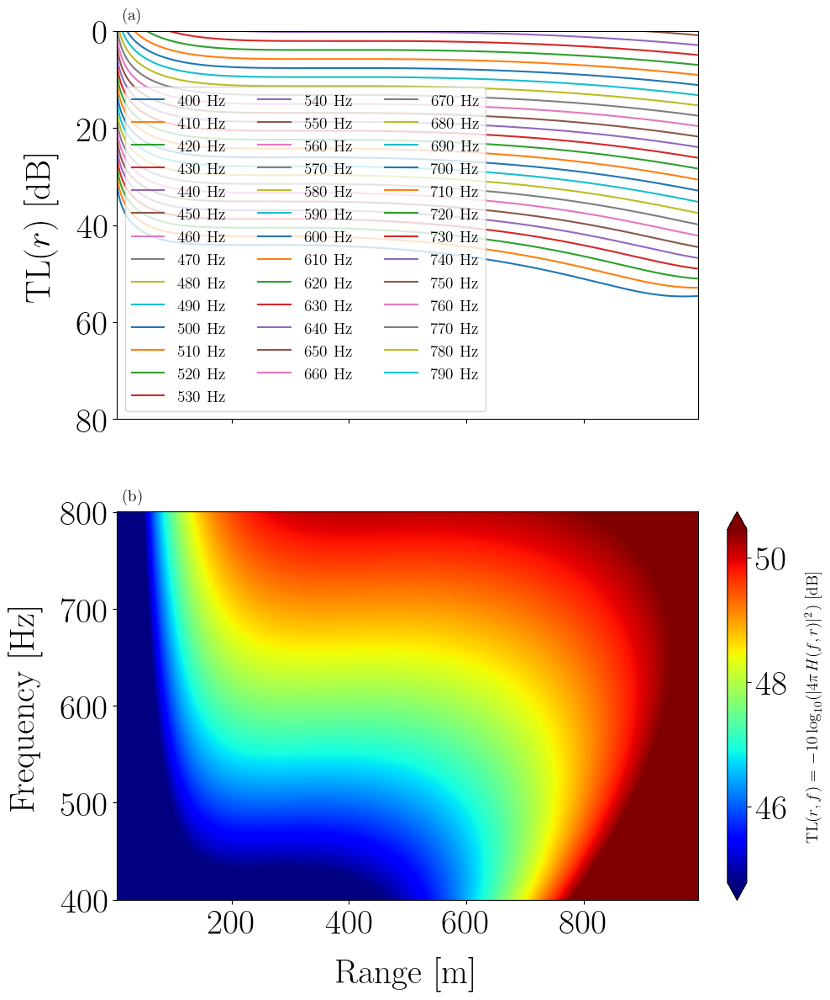

In [9]:
plot_intensity(I_1_dB, fmin, fmax, step_f=10)

Les pertes par transmission font apparaitre le pattern d'interférence caractéristique. La pente des maximas est décrite par l'invariant de guide d'onde.  

### Lien avec le rapport des fonctions de transfert 

Les pertes par transmissions associées à chacun des capteurs s'écrivent : 
$$
\text{TL}_1(r, f) = -10 \log_{10}(\lvert 4 \pi H_1(f, r) \rvert^2)
$$ 
et
$$
\text{TL}_2(r, f) = -10 \log_{10}(\lvert 4 \pi H_2(f, r) \rvert^2)
$$ 

Le module du rapport des fonctions de transfert s'écrit donc en fonction des pertes $\text{TL}_1(r, f)$ et $\text{TL}_2(r, f)$ :

$$
10 \log_{10} \left( \lvert \Pi_2(f, r) \rvert^2 \right) =  10 \log_{10}(\left \lvert \frac{4 \pi H_2(f, r)}{4 \pi H_1(f, r)} \right \rvert^2)
\newline =  \text{TL}_1(r, f) - \text{TL}_2(r, f) 
$$


(<Figure size 1800x1200 with 6 Axes>,
 array([<Axes: title={'center': '$\\text{TL}_1(r, f) = -10 \\log_{10}(\\lvert 4 \\pi H_1(f, r) \\rvert^2)$'}>,
        <Axes: title={'center': '$\\text{TL}_2(r, f) = -10 \\log_{10}(\\lvert 4 \\pi H_2(f, r) \\rvert^2)$'}>,
        <Axes: title={'center': '$10 \\log_{10} \\left( \\lvert \\Pi_2(f, r) \\rvert^2 \\right) =  \\text{TL}_1(r, f) - \\text{TL}_2(r, f) $'}>],
       dtype=object))

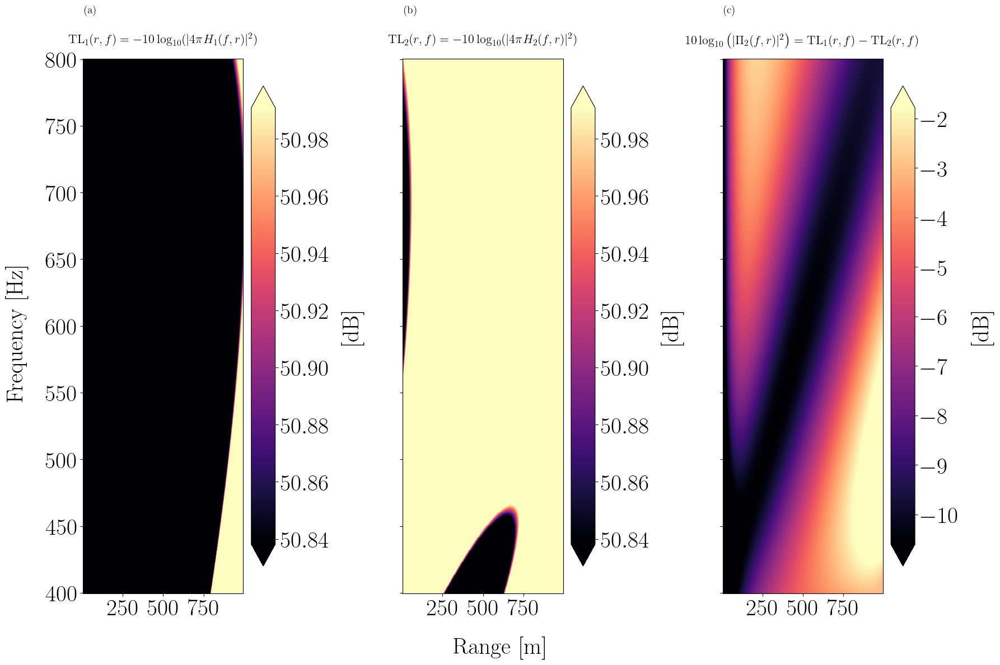

In [10]:
plot_tl_pi_frequency_range_plan(I_1_dB, I_2_dB, rtf2_mod, x_coord="r", y_coord="f")

On peut également visualiser dans le plan (f, r) comme précédemment (par exemple pour les essais Groix)

(<Figure size 1800x1200 with 6 Axes>,
 array([<Axes: title={'center': '$\\text{TL}_1(r, f) = -10 \\log_{10}(\\lvert 4 \\pi H_1(f, r) \\rvert^2)$'}>,
        <Axes: title={'center': '$\\text{TL}_2(r, f) = -10 \\log_{10}(\\lvert 4 \\pi H_2(f, r) \\rvert^2)$'}>,
        <Axes: title={'center': '$10 \\log_{10} \\left( \\lvert \\Pi_2(f, r) \\rvert^2 \\right) =  \\text{TL}_1(r, f) - \\text{TL}_2(r, f) $'}>],
       dtype=object))

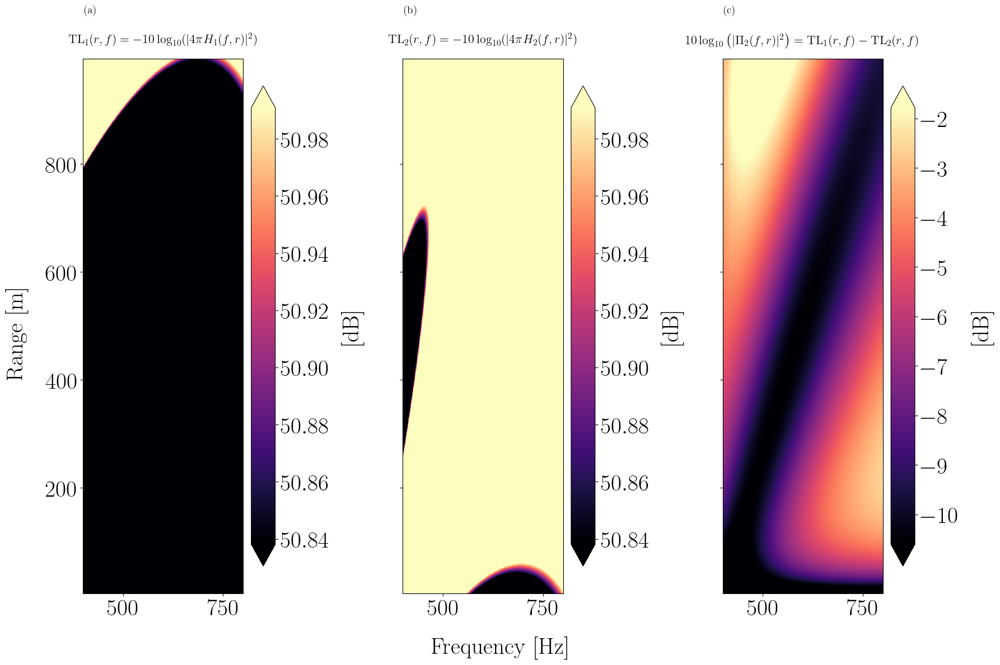

In [11]:
plot_tl_pi_frequency_range_plan(I_1_dB, I_2_dB, rtf2_mod, x_coord="f", y_coord="r")

## Cas M = 3

On considère à présent le cas M=3. 

In [12]:
distances=["hermitian_angle"]

m_mode = 3
ds = run_full_study(
    bottom_bc=bottom_bc,
    waveguide_depth=waveguide_depth,
    d_inter_rcv=d_inter_rcv,
    z_rcv=z_rcv,
    src_ref_range=src_ref_range,
    z_src=z_src,
    nrgrid=nrgrid,
    delta_r=delta_r,
    fmin=fmin,
    fmax=fmax,
    nfgrid=nfgrid,
    root_img=root_img,
    distances=distances,
    n_modes=m_mode,
)

Number of propagating modes at fmin = 400 Hz : 16
Number of propagating modes at fmax = 800 Hz : 32
Computing RTF using  M = 3 modes (instead of all the propagating modes which are 32 at fmax)


Dataset computed


### Allure des fonctions de transfert 

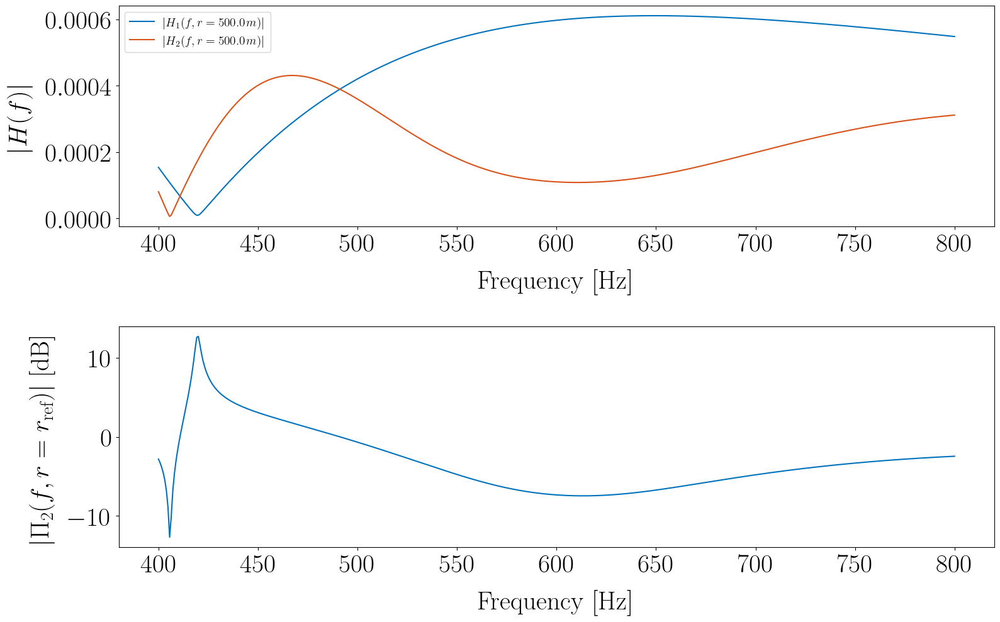

In [13]:
tf1_mod = np.abs(ds.H1)
tf2_mod = np.abs(ds.H2)


fig, axs = plt.subplots(2, 1, figsize=(16, 10))

tf1_mod.sel(r=ds.r_ref, method="nearest").plot(
    label=rf"$\lvert H_1 (f, r={{{ds.r_ref}}}m) \rvert$", color=color(0), ax=axs[0]
)
tf2_mod.sel(r=ds.r_ref, method="nearest").plot(
    label=rf"$\lvert H_2 (f, r={{{ds.r_ref}}}m) \rvert$", color=color(1), ax=axs[0]
)
axs[0].set_ylabel(r"$\lvert H(f) \rvert$")
axs[0].legend()
axs[0].set_title("")


rtf2_mod = ds.module.sel(h_index=2)
rtf2_mod_log = 10 * np.log10(rtf2_mod)

rtf2_mod_log.sel(r=ds.r_ref, method="nearest").plot(
    label=rf"$\lvert \Pi_{2} (f, r={{{ds.r_ref}}}m) \rvert$", color=color(0), ax=axs[1]
)

axs[1].set_ylabel(r"$\lvert \Pi_2(f, r=r_\text{ref}) \rvert $ [dB]")
axs[1].set_title("")

fpath = os.path.join(root_img, f"tf_and_rtf_m_{m_mode}.png")
plt.savefig(fpath, dpi=300)

### Pertes dans le guide d'onde 


In [14]:
I_1 = np.abs(4 * np.pi * ds.H1) ** 2
I_2 = np.abs(4 * np.pi * ds.H2) ** 2
I_1_dB = -10 * np.log10(I_1 + 1e-12)
I_2_dB = -10 * np.log10(I_2 + 1e-12)

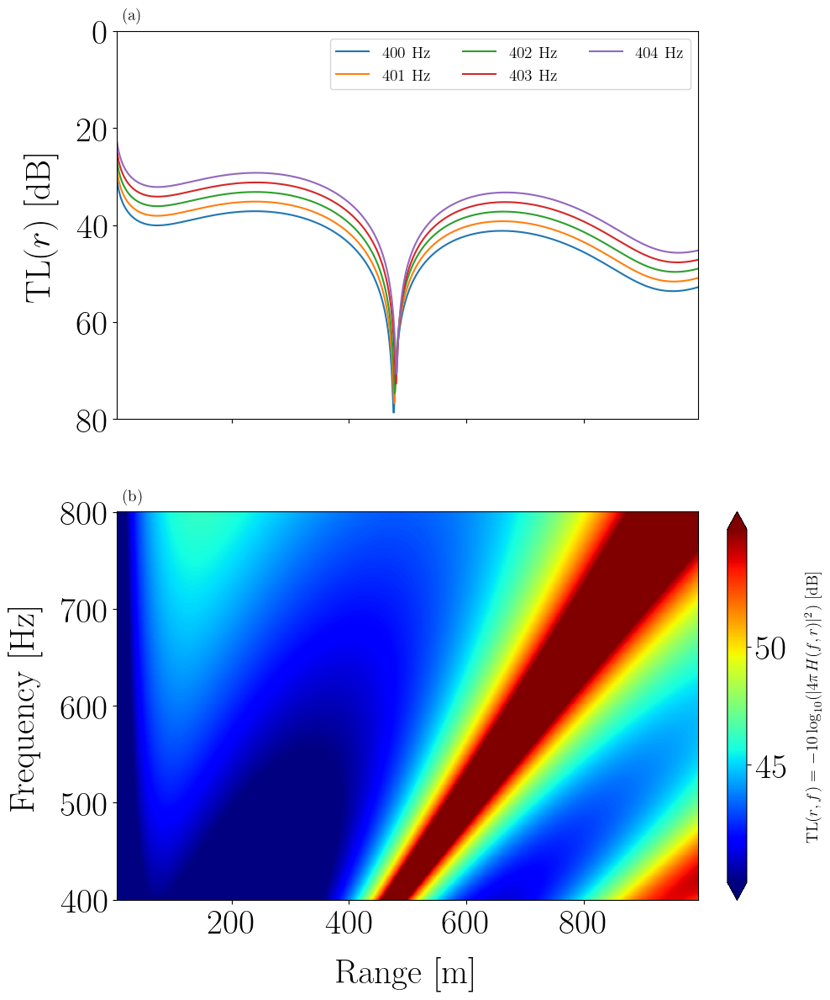

In [15]:
plot_intensity(I_1_dB, fmin, fmin+5, step_f=1)
plt.savefig(os.path.join(root_img, f"intensity_H1_m_{m_mode}.png"), dpi=300)

L'ajout du mode m = 3, conduit à une structure légèrement plus complexe. Les structures plus fine échelle observables résultent des interférences mode 3 / mode 1 ($\Delta_{k_{31}}$)et mode 3 / mode 2 ($\Delta_{k_{32}}$). 

(<Figure size 1800x1200 with 6 Axes>,
 array([<Axes: title={'center': '$\\text{TL}_1(r, f) = -10 \\log_{10}(\\lvert 4 \\pi H_1(f, r) \\rvert^2)$'}>,
        <Axes: title={'center': '$\\text{TL}_2(r, f) = -10 \\log_{10}(\\lvert 4 \\pi H_2(f, r) \\rvert^2)$'}>,
        <Axes: title={'center': '$10 \\log_{10} \\left( \\lvert \\Pi_2(f, r) \\rvert^2 \\right) =  \\text{TL}_1(r, f) - \\text{TL}_2(r, f) $'}>],
       dtype=object))

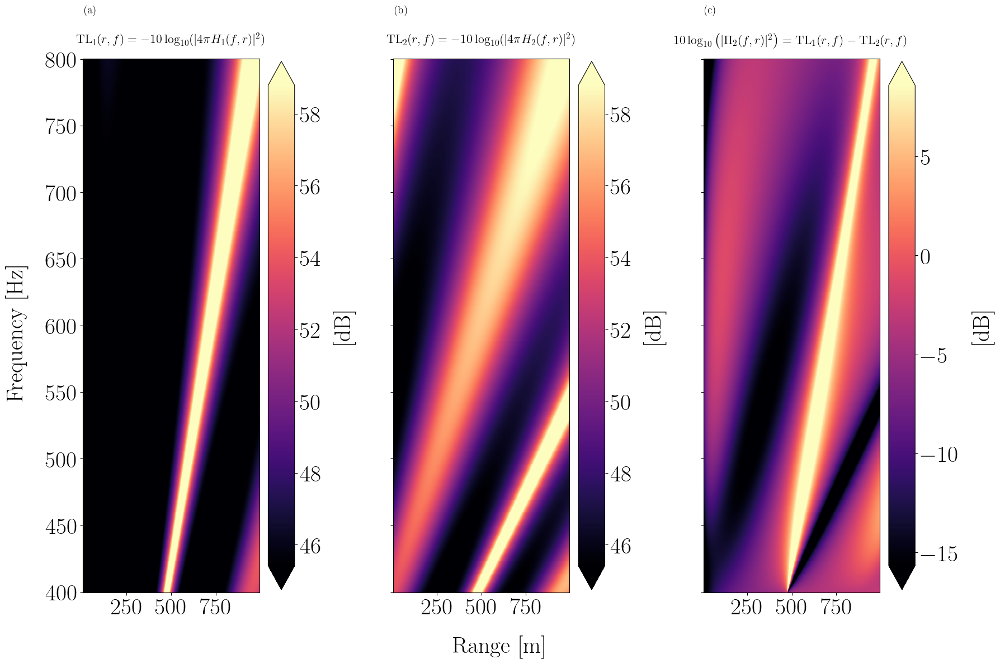

In [16]:
plot_tl_pi_frequency_range_plan(I_1_dB, I_2_dB, rtf2_mod, x_coord="r", y_coord="f")

On peut également visualiser dans le plan (f, r) comme précédemment (par exemple pour les essais Groix)

(<Figure size 1800x1200 with 6 Axes>,
 array([<Axes: title={'center': '$\\text{TL}_1(r, f) = -10 \\log_{10}(\\lvert 4 \\pi H_1(f, r) \\rvert^2)$'}>,
        <Axes: title={'center': '$\\text{TL}_2(r, f) = -10 \\log_{10}(\\lvert 4 \\pi H_2(f, r) \\rvert^2)$'}>,
        <Axes: title={'center': '$10 \\log_{10} \\left( \\lvert \\Pi_2(f, r) \\rvert^2 \\right) =  \\text{TL}_1(r, f) - \\text{TL}_2(r, f) $'}>],
       dtype=object))

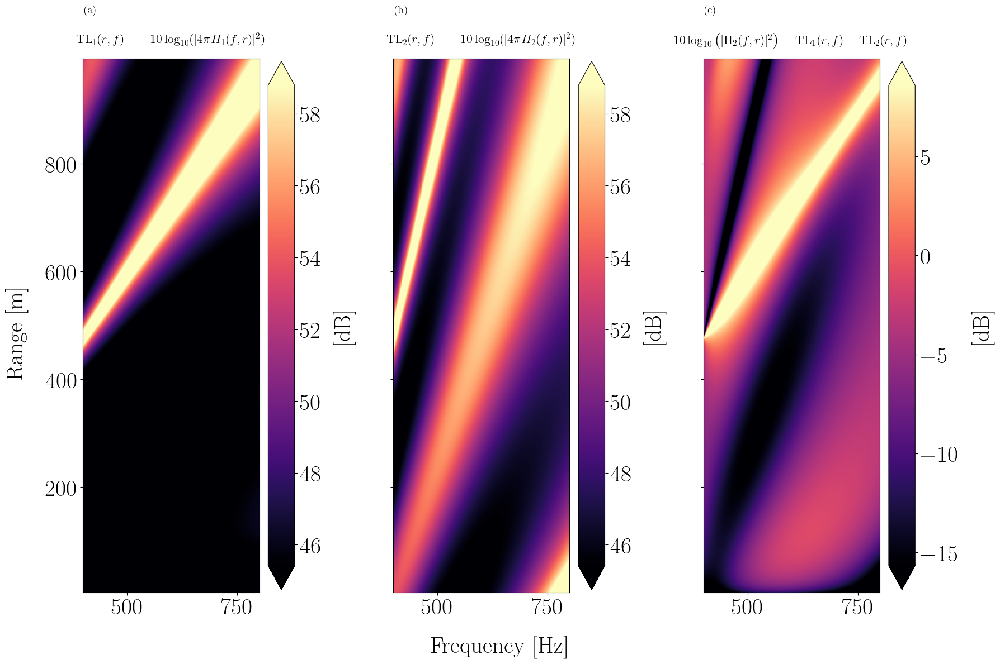

In [17]:
plot_tl_pi_frequency_range_plan(I_1_dB, I_2_dB, rtf2_mod, x_coord="f", y_coord="r")

## Illustration retenue M = 16

On fixe m = 16, ce choix permet d'assurer le même nombre de modes propagatifs sur la bande de fréquence considérée. 

Number of propagating modes at fmin = 400 Hz : 16
Number of propagating modes at fmax = 800 Hz : 32
Computing RTF using  M = 16 modes (instead of all the propagating modes which are 32 at fmax)
Dataset computed


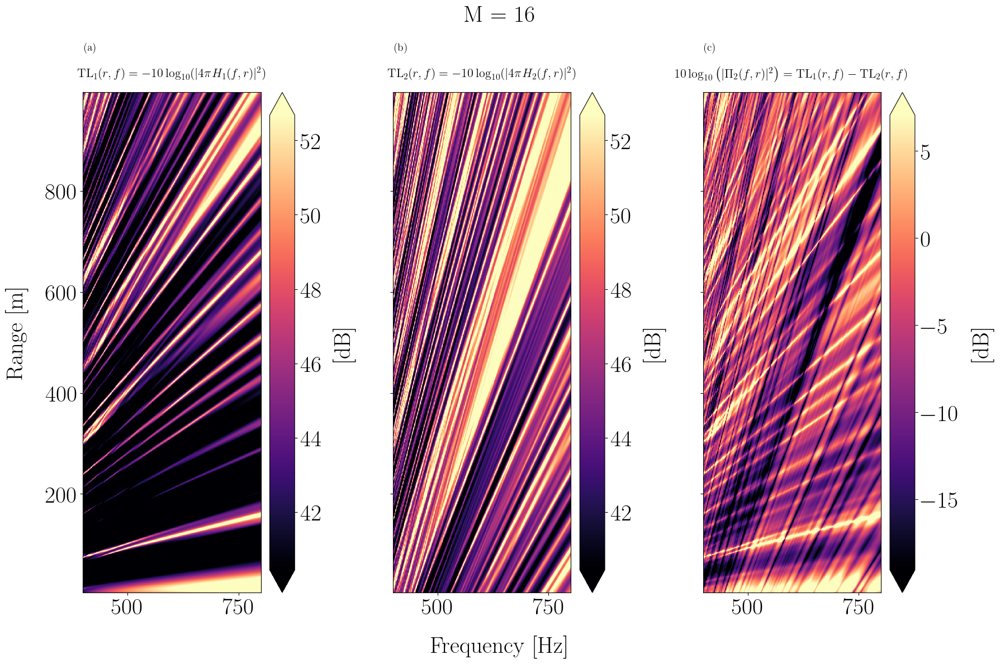

In [18]:
m = 16
ds = run_full_study(
    bottom_bc=bottom_bc,
    waveguide_depth=waveguide_depth,
    d_inter_rcv=d_inter_rcv,
    z_rcv=z_rcv,
    src_ref_range=src_ref_range,
    z_src=z_src,
    nrgrid=nrgrid,
    delta_r=delta_r,
    fmin=fmin,
    fmax=fmax,
    nfgrid=nfgrid,
    root_img=root_img,
    distances=distances,
    n_modes=m,
)

I_1 = np.abs(4 * np.pi * ds.H1) ** 2
I_2 = np.abs(4 * np.pi * ds.H2) ** 2
I_1_dB = -10 * np.log10(I_1 + 1e-12)
I_2_dB = -10 * np.log10(I_2 + 1e-12)

rtf2_mod = ds.module.sel(h_index=2)

fig, axs = plot_tl_pi_frequency_range_plan(
    I_1_dB, I_2_dB, rtf2_mod, x_coord="f", y_coord="r"
)
fig.suptitle(f"M = {m}")

fpath = os.path.join(root_img, f"tl_pi_freq_range_plan_m_{m}.png")
plt.savefig(fpath, dpi=300)

Le rapport des fonctions de transfert présente des structures analogues à celles observées sur la séquence 144 de la campagne à Groix. En particulier on retrouve bien une superposition de deux jeux de franges d'interférences de pentes différentes. 

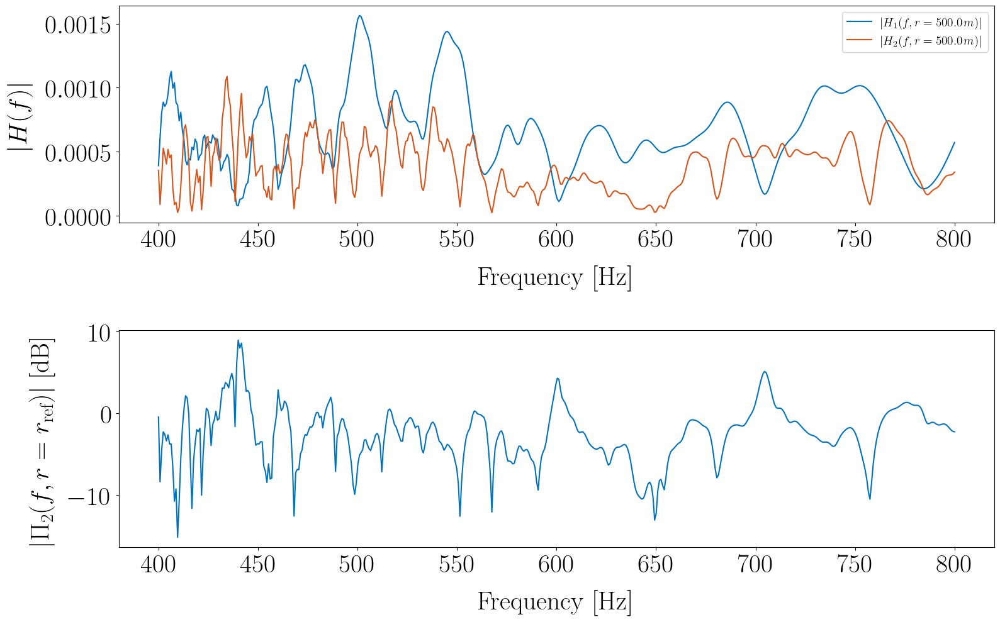

In [19]:
# tf1_mod = 10 * np.log10(np.abs(ds.H1))
# tf2_mod = 10 * np.log10(np.abs(ds.H2))
tf1_mod = np.abs(ds.H1)
tf2_mod = np.abs(ds.H2)

fig, axs = plt.subplots(2, 1, figsize=(16, 10))

tf1_mod.sel(r=ds.r_ref, method="nearest").plot(
    label=rf"$\lvert H_1 (f, r={{{ds.r_ref}}}m) \rvert$", color=color(0), ax=axs[0]
)
tf2_mod.sel(r=ds.r_ref, method="nearest").plot(
    label=rf"$\lvert H_2 (f, r={{{ds.r_ref}}}m) \rvert$", color=color(1), ax=axs[0]
)
axs[0].set_ylabel(r"$\lvert H(f) \rvert$")
axs[0].legend()
axs[0].set_title("")


rtf2_mod = ds.module.sel(h_index=2)
rtf2_mod_log = 10 * np.log10(rtf2_mod)

rtf2_mod_log.sel(r=ds.r_ref, method="nearest").plot(
    label=rf"$\lvert \Pi_{2} (f, r={{{ds.r_ref}}}m) \rvert$", color=color(0), ax=axs[1]
)

axs[1].set_ylabel(r"$\lvert \Pi_2(f, r=r_\text{ref}) \rvert $ [dB]")
axs[1].set_title("")

fpath = os.path.join(root_img, f"tf_and_rtf_m_{m}.png")
plt.savefig(fpath, dpi=300)

## Mode M > 3

On peut observer la complexification de la surface en fonction du nombre de modes propagatifs. 

In [20]:
distances=["hermitian_angle"]

list_m = np.arange(4, M+1, 4)
ds_dict = {}
for m in list_m:
    ds = run_full_study(
        bottom_bc=bottom_bc,
        waveguide_depth=waveguide_depth,
        d_inter_rcv=d_inter_rcv,
        z_rcv=z_rcv,
        src_ref_range=src_ref_range,
        z_src=z_src,
        nrgrid=nrgrid,
        delta_r=delta_r,
        fmin=fmin,
        fmax=fmax,
        nfgrid=nfgrid,
        root_img=root_img,
        distances=distances,
        n_modes=m,
    )

    ds_dict[m] = ds

Number of propagating modes at fmin = 400 Hz : 16
Number of propagating modes at fmax = 800 Hz : 32
Computing RTF using  M = 4 modes (instead of all the propagating modes which are 32 at fmax)


Dataset computed
Number of propagating modes at fmin = 400 Hz : 16
Number of propagating modes at fmax = 800 Hz : 32
Computing RTF using  M = 8 modes (instead of all the propagating modes which are 32 at fmax)
Dataset computed
Number of propagating modes at fmin = 400 Hz : 16
Number of propagating modes at fmax = 800 Hz : 32
Computing RTF using  M = 12 modes (instead of all the propagating modes which are 32 at fmax)
Dataset computed
Number of propagating modes at fmin = 400 Hz : 16
Number of propagating modes at fmax = 800 Hz : 32
Computing RTF using  M = 16 modes (instead of all the propagating modes which are 32 at fmax)
Dataset computed
Number of propagating modes at fmin = 400 Hz : 16
Number of propagating modes at fmax = 800 Hz : 32
Computing RTF using  M = 20 modes (instead of all the propagating modes which are 32 at fmax)
Dataset computed
Number of propagating modes at fmin = 400 Hz : 16
Number of propagating modes at fmax = 800 Hz : 32
Computing RTF using  M = 24 modes (inste

In [21]:
for m in list_m:
    ds = ds_dict[m]
    I_1 = np.abs(4 * np.pi * ds.H1) ** 2
    I_2 = np.abs(4 * np.pi * ds.H2) ** 2
    I_1_dB = -10 * np.log10(I_1 + 1e-12)
    I_2_dB = -10 * np.log10(I_2 + 1e-12)

    rtf2_mod = ds.module.sel(h_index=2)

    fig, axs = plot_tl_pi_frequency_range_plan(
        I_1_dB, I_2_dB, rtf2_mod, x_coord="f", y_coord="r"
    )
    fig.suptitle(f"M = {m}")
    plt.show()

    # fpath = os.path.join(root_img, f"tl_pi_freq_range_plan_m_{m}.png")
    # plt.savefig(fpath, dpi=300)

# Variabilité spatiale des RTFs et domaine de variations monotones de la distance $\theta$ 

Afin d'illustrer l'impact de la forte variabilité des RTFs sur la mesure de similarité et par conséquence sur la méthode de localisation proposée, l'angle $\theta$ entre le vecteur de RTF associé à la position de référence $r_0 = 1150~\text{m}$ et les vecteurs de RTF $\Pi(r)$ est calculé pour chacune des positions $r \in [900, 1400]~\text{m}$. 

Idéalement, la distance $\theta$ dans l'espace des données traduit la distance dans l'espace réel et $\theta(r)$ doit donc varier de manière monotones par rapport à la coordonnée $r$. 



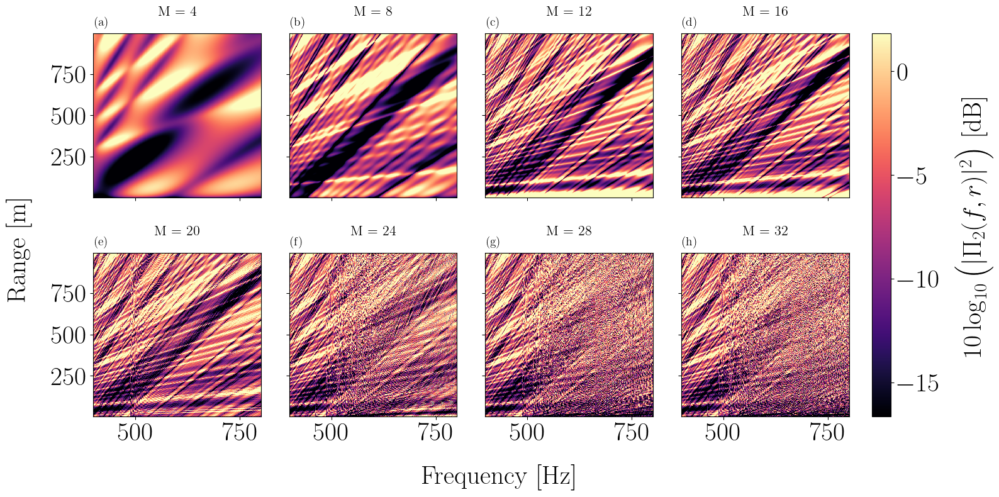

In [ ]:
x_coord = "f"
y_coord = "r"

# Plot a panels of the RTF for different number of modes
ncol = 4
nrow  = len(list_m) // 4 + 1 if len(list_m) % 4 != 0 else len(list_m) // 4
fig, axs = plt.subplots(nrow, ncol, figsize=(4*ncol, 4*nrow), sharex=True, sharey=True)
axs = axs.flatten()

vmins = []
vmaxs = []
for i_m, m in enumerate(ds_dict.keys()):
    ds = ds_dict[m]
    rtf2_mod = ds.module.sel(h_index=2)
    rtf2_mod_2_log = 10 * np.log10(rtf2_mod**2)

    vmin = np.percentile(rtf2_mod_2_log, 5)
    vmins.append(vmin)
    vmax = np.percentile(rtf2_mod_2_log, 95)
    vmaxs.append(vmax)

vmin = max(vmins)
vmax = min(vmaxs)

for i_m, m in enumerate(ds_dict.keys()):
    ds = ds_dict[m]
    rtf2_mod = ds.module.sel(h_index=2)
    rtf2_mod_2_log = 10 * np.log10(rtf2_mod**2)

    im = rtf2_mod_2_log.plot(
        ax=axs[i_m],
        x=x_coord,
        y=y_coord,
        cmap="magma",
        add_colorbar=False,
        # cbar_kwargs={
        #     "label": r"$10 \log_{10} \left( \lvert \Pi_2(f, r) \rvert^2 \right)$" + " [dB]",
        # },
        vmin=vmin,
        vmax=vmax,
    )
    axs[i_m].set_title(
        f"M = {m}", fontsize=16,
    )
    axs[i_m].set_xlabel("")
    axs[i_m].set_ylabel("")

    # if d_inter_rcv >= ds.r.min():
    #     # axs[i_m].axhline(d_inter_rcv)
    #     if i_m ==0:
    #         axs[i_m].annotate(
    #             text=r"$r = d_{12}$",
    #             xy=(plt.gca().get_xlim()[0], d_inter_rcv),
    #             xytext=(
    #                 plt.gca().get_xlim()[0]
    #                 - 0.35 * (plt.gca().get_xlim()[1] - plt.gca().get_xlim()[0]),
    #                 d_inter_rcv,
    #             ),
    #             fontsize=16,
    #             arrowprops=dict(arrowstyle="->", color=color(0)),
    #             horizontalalignment="center",
    #             verticalalignment="center",
    #         )
    #     else:
    #         axs[i_m].annotate(
    #             text="",
    #             xy=(plt.gca().get_xlim()[0], d_inter_rcv),
    #             xytext=(
    #                 plt.gca().get_xlim()[0]
    #                 - 0.2 * (plt.gca().get_xlim()[1] - plt.gca().get_xlim()[0]),
    #                 d_inter_rcv,
    #             ),
    #             fontsize=16,
    #             arrowprops=dict(arrowstyle="->", color=color(0)),
    #             horizontalalignment="center",
    #             verticalalignment="center",
    #         )

if x_coord == "r":
    fig.supxlabel("Range [m]")
    fig.supylabel("Frequency [Hz]")
elif x_coord == "f":
    fig.supylabel("Range [m]")
    fig.supxlabel("Frequency [Hz]")

set_subfigures_abc_labels(axs, x_pos=0.005, y_pos=1.1, fontsize=14)

clabel = r"$10 \log_{10} \left( \lvert \Pi_2(f, r) \rvert^2 \right)$" + " [dB]"
fig.colorbar(
    im,
    ax=axs.ravel().tolist(),
    label=clabel,
    orientation="vertical",
    fraction=1.0,
    pad=0.03,
)

fpath = os.path.join(root_img, f"tl_pi_freq_range_plan_multiple_m.png")
plt.savefig(fpath, dpi=300)

In [ ]:
distances = ["hermitian_angle"]
dist_dict = {
    m: get_dist(ds_dict[m], distances=distances)["hermitian_angle"]["d"]
    for m in ds_dict.keys()
}

# Smooth the distances with a moving average
window_size = 10
dist_dict_smooth = {}
for m in dist_dict.keys():
    dist = dist_dict[m]
    dist_smooth = np.convolve(dist, np.ones(window_size) / window_size, mode="same")
    dist_dict_smooth[m] = dist_smooth
    

In [ ]:
window_size_r = window_size * (ds.r[1] - ds.r[0]).values
print(f"Moving average window size: {window_size_r:.2f} m")

Moving average window size: 4.95 m


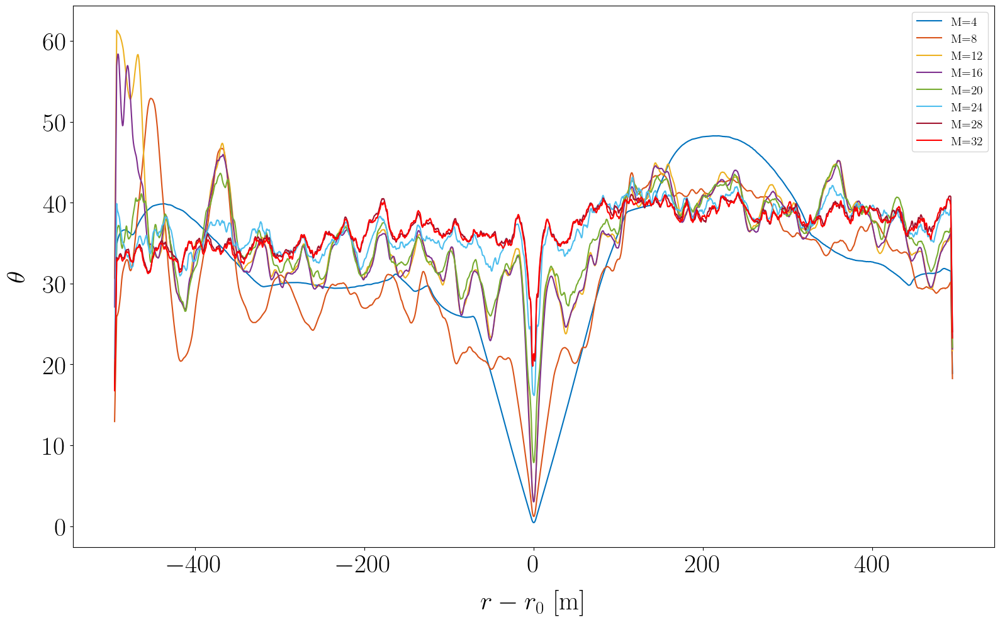

In [ ]:

plt.figure(figsize=(16, 10))

r_grid_shift = ds.r.values - ds.r_ref
for i_m, m in enumerate(dist_dict.keys()):
    # dist = dist_dict[m]
    dist = dist_dict_smooth[m]
    plt.plot(r_grid_shift, dist, color=color(i_m), label=f"M={m}")

plt.xlabel(r"$r - r_0$ [m]")
plt.ylabel(r"$\theta$")
plt.legend()


# fpath = os.path.join(root_img, f"distance_m_{m}.png")
# plt.savefig(fpath, dpi=300)


In [ ]:
# # Compute the validity range of the distance used

# # Define thresholds
# r_validity_dict = {}
# q_th = [25, 50, 75]
# for i_m, m in enumerate(dist_dict.keys()):
#     d = dist_dict[m]
#     d_th = [np.percentile(d, q=qi) for qi in q_th]

#     for d_th_i in d_th:
#         # Find index below threshold
#         idx_below_th = np.where(d <= d_th_i)[0]
#         # Find ranges corresponding to these indices
#         r_below_th = r_grid_shift[idx_below_th]
#         # Compute validity range
#         r_validity = r_below_th.max() - r_below_th.min()

#         # Store validity range in dictionary
#         if m not in r_validity_dict:
#             r_validity_dict[m] = {}
#         r_validity_dict[m][d_th_i] = r_validity


#         # print(f"M={m}, d_th={d_th_i:.4f}, validity range = {r_validity:.2f} m")

In [ ]:
# Define validity domain according to the first maximum of the distance (first zero crossing of the derivative)
r_validity_dict_zero_crossing = {}
r_th_zero_crossing_pos = {}
r_th_zero_crossing_neg = {}

for i_m, m in enumerate(dist_dict.keys()):
    d = dist_dict[m]

    # Positive r - r0
    d_pos = d[r_grid_shift >= 0]
    r_pos = r_grid_shift[r_grid_shift >= 0]

    # Compute the derivative of the distance
    dd_dr_pos = np.gradient(d_pos, r_pos)
    # Find zero crossings of the derivative
    zero_crossings_pos = np.where(np.diff(np.sign(dd_dr_pos)))[0]
    if len(zero_crossings_pos) > 0:
        # Take the first zero crossing
        first_zero_crossing_pos = zero_crossings_pos[0]
        r_validity_zero_crossing_pos = r_pos[first_zero_crossing_pos]
        # Store the threshold corresponding to this zero crossing
        r_th_zero_crossing_pos[m] = r_validity_zero_crossing_pos

    # Negative r - r0
    d_neg = d[r_grid_shift < 0]
    r_neg = r_grid_shift[r_grid_shift < 0]
    dd_dr_neg = np.gradient(d_neg, r_neg)
    zero_crossings_neg = np.where(np.diff(np.sign(dd_dr_neg)))[0]
    if len(zero_crossings_neg) > 0:
        first_zero_crossing_neg = zero_crossings_neg[-1]
        r_validity_zero_crossing_neg = r_neg[first_zero_crossing_neg]
        # Store the threshold corresponding to this zero crossing
        r_th_zero_crossing_neg[m] = r_validity_zero_crossing_neg

    r_validity_zero_crossing = r_validity_zero_crossing_pos - r_validity_zero_crossing_neg
    # Store the validity range in the dictionary
    r_validity_dict_zero_crossing[m] = r_validity_zero_crossing

    print(f"M={m}, first zero crossing at r={r_validity_zero_crossing:.2f} m")

M=4, first zero crossing at r=181.17 m
M=8, first zero crossing at r=65.83 m
M=12, first zero crossing at r=34.65 m
M=16, first zero crossing at r=35.64 m
M=20, first zero crossing at r=30.69 m
M=24, first zero crossing at r=5.45 m
M=28, first zero crossing at r=3.96 m
M=32, first zero crossing at r=3.96 m


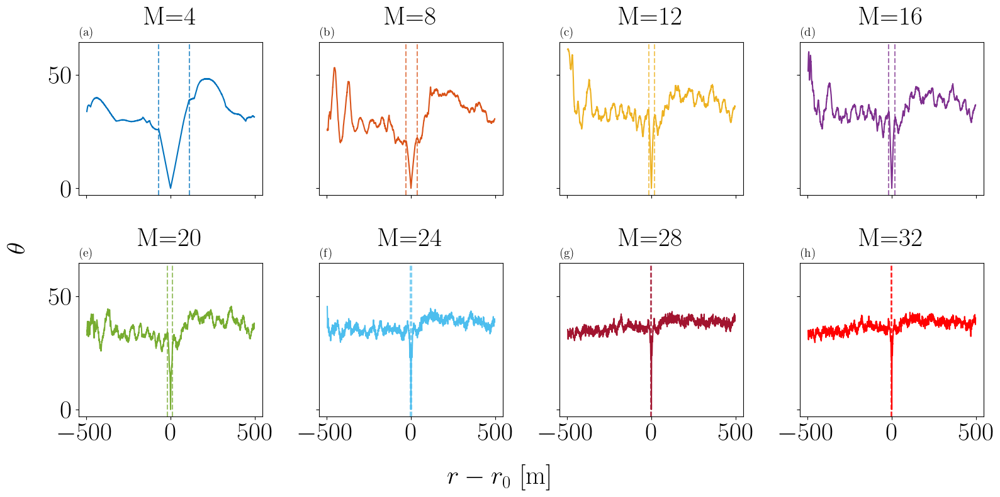

In [ ]:
# Same figure of theta but using panel of subplots for different M
ncol = 4
nrow  = len(list_m) // 4 + 1 if len(list_m) % 4 != 0 else len(list_m) // 4
fig, axs = plt.subplots(nrow, ncol, figsize=(4*ncol, 4*nrow), sharex=True, sharey=True)
axs = axs.flatten()
for i_m, m in enumerate(dist_dict.keys()):
    dist = dist_dict[m]
    axs[i_m].plot(r_grid_shift, dist, color=color(i_m))
    axs[i_m].set_title(f"M={m}")
    axs[i_m].set_xlabel("")
    axs[i_m].set_ylabel("")

    # # Add vertical lines corresponding to validity range for different thresholds
    # for d_th_i in r_validity_dict[m].keys():
    #     r_validity = r_validity_dict[m][d_th_i]
    #     axs[i_m].axvline(
    #         x=-r_validity/2, color=color(i_m), linestyle="--", alpha=0.7
    #     )
    #     axs[i_m].axvline(
    #         x=r_validity/2, color=color(i_m), linestyle="--", alpha=0.7
    #     )

    # Add vertical lines corresponding to validity range
    axs[i_m].axvline(
        x=r_th_zero_crossing_pos[m], color=color(i_m), linestyle="--", alpha=0.7
    )
    axs[i_m].axvline(
        x=r_th_zero_crossing_neg[m], color=color(i_m), linestyle="--", alpha=0.7
    )

fig.supxlabel(r"$r - r_0$ [m]")
fig.supylabel(r"$\theta$")
set_subfigures_abc_labels(axs, x_pos=0.005, y_pos=1.1, fontsize=14)

fpath = os.path.join(root_img, f"distance_multiple_m.png")
plt.savefig(fpath, dpi=300)

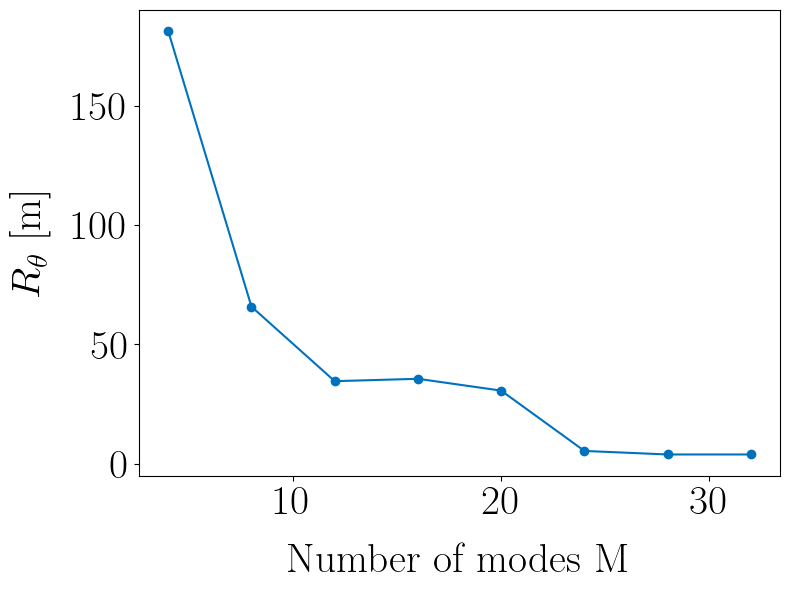

In [ ]:
# Plot the validity range as a function of M

m_values = list(r_validity_dict_zero_crossing.keys())
validity_ranges = list(r_validity_dict_zero_crossing.values())
plt.figure(figsize=(8, 6))
plt.plot(m_values, validity_ranges, marker="o", color=color(0))
plt.xlabel("Number of modes M")
# plt.ylabel("Validity range [m]")
plt.ylabel(r"$R_\theta$ [m]")


fpath = os.path.join(root_img, f"validity_range_vs_M.png")
plt.savefig(fpath, dpi=300)

In [ ]:
print(m_values, validity_ranges)

# Comparaison des termes de $\lvert \Pi_2 \rvert$

<!-- $$
\alpha_1 = 10 \log_{10} \left( \frac{r}{\lvert r - d_{12} \rvert} \right)
$$
$$
\alpha_2 = 10 \log_{10} \left(\sum_{m=1}^{M} A_m^2 + \sum_{m=1}^{M} \sum_{n > m}^{M} 2 A_m A_n \cos\left( \Delta k_{mn} \lvert r - d_{12} \rvert \right) \right)
$$

$$
\alpha_3 = 10 \log_{10} \left( \sum_{m=1}^{M} A_m^2 + \sum_{m=1}^{M} \sum_{n > m}^{M} 2 A_m A_n \cos\left( \Delta k_{mn} r \right) \right)
$$

$$
        10 \log_{10} \left( \lvert \Pi_2(f, r) \rvert^2 \right) =  \alpha_1 + \alpha_2 + \alpha_3
$$ -->

$$
\gamma_1 = 10 \log_{10} \left( \frac{r}{r + d_{12}} \right)
$$
$$
\gamma_2 = 10 \log_{10} \left(\sum_{m=1}^{M} A_m^2 + \sum_{m=1}^{M} \sum_{n > m}^{M} 2 A_m A_n \cos\left( \Delta k_{mn} (r + d_{12}) \right) \right)
$$

$$
\gamma_3 = 10 \log_{10} \left( \sum_{m=1}^{M} A_m^2 + \sum_{m=1}^{M} \sum_{n > m}^{M} 2 A_m A_n \cos\left( \Delta k_{mn} r \right) \right)
$$

$$
        10 \log_{10} \left( \lvert \Pi_2(f, r) \rvert^2 \right) =  \alpha_1 + \alpha_2 + \alpha_3
$$

On a 
$$
I_1 = \lvert 4 \pi H_1 \rvert^2 
$$
et 
$$
I_1 = \frac{\tilde{Q}} {r} \left( \sum_{m=1}^{M} A_m^2 + \sum_{m=1}^{M} \sum_{n > m}^{M} 2 A_m A_n \cos\left( \Delta k_{mn} r \right) \right)
$$
avec 
$$
\tilde{Q} = \frac{2 \pi}{\rho(z_s)}
$$
D'où 
$$
\gamma_3 = 10 \log_{10} \left( \frac{r}{\tilde{Q}} I_1  \right)
$$

De manière analogue, 

$$
\gamma_2 = 10 \log_{10} \left( \frac{r + d_{12} }{\tilde{Q}} I_2  \right)
$$

## Définition des différents termes 

In [ ]:
m = 16
ds = ds_dict[m]
r = ds.r.values 
f = ds.f.values 
rtf2_mod = ds.module.sel(h_index=2)
rtf2_mod_2_log = 10 * np.log10(rtf2_mod**2)


Q_tild = 2 * np.pi / g.rho_w
I_1 = np.abs(4 * np.pi * ds.H1) ** 2
I_2 = np.abs(4 * np.pi * ds.H2) ** 2

# alpha_1 = 10 * np.log10(r / np.abs(r - d_inter_rcv))
# alpha_2 = 10 * np.log10(np.abs(r - d_inter_rcv) / Q_tild * I_2)
gamma_1 = 10 * np.log10(r / (r + d_inter_rcv))
gamma_2 = 10 * np.log10((r + d_inter_rcv) / Q_tild * I_2)
gamma_3 = 10 * np.log10(r / Q_tild * I_1)
rtf2_mod_2_log_bis = gamma_1 + gamma_2 - gamma_3

### Vérification 

False
<xarray.DataArray ()> Size: 8B
array(5.9060243e-06)
Coordinates:
    h_index  int32 4B 2
Attributes:
    units:    1


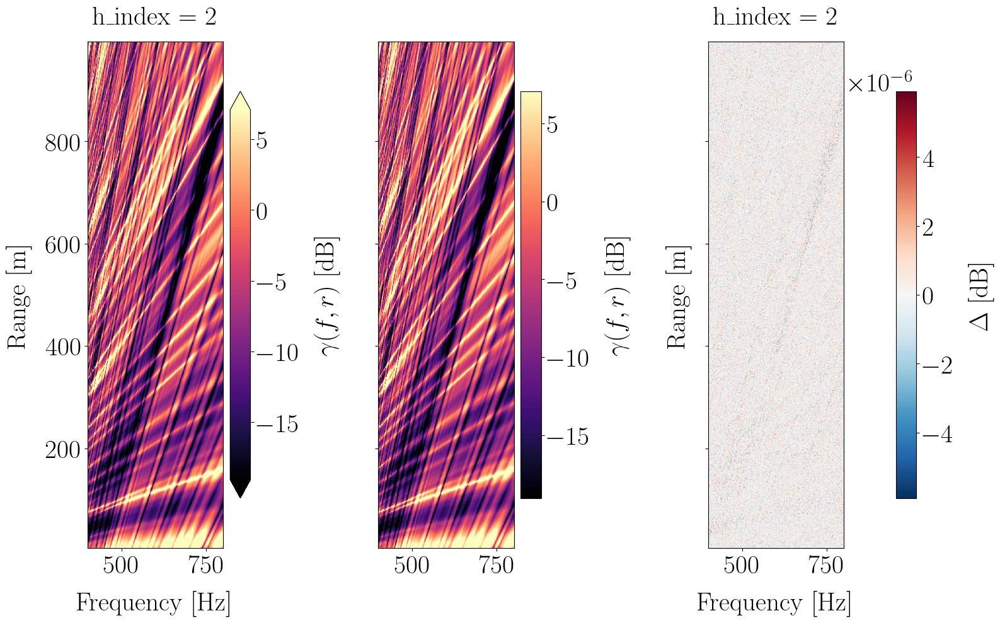

In [ ]:
fig, axs = plt.subplots(1, 3, sharey=True)
vmin = max(np.percentile(rtf2_mod_2_log, 5), np.percentile(rtf2_mod_2_log_bis, 5))
vmax = min(np.percentile(rtf2_mod_2_log, 95), np.percentile(rtf2_mod_2_log_bis, 95))
# clabel = r"$10 \log_{10} \left( \lvert \Pi_2(f, r) \rvert^2 \right)$" + " [dB]"
clabel = r"$\gamma(f, r)$" + " [dB]"

rtf2_mod_2_log.plot(x="f", ax=axs[0], cmap="magma", vmin=vmin, vmax=vmax, cbar_kwargs={"label": clabel})

im = axs[1].pcolormesh(f, r, rtf2_mod_2_log_bis.T, cmap="magma", vmin=vmin, vmax=vmax)
plt.colorbar(im, ax=axs[1], label=clabel)

# One can check that the two array are equal
print(np.allclose(10**(rtf2_mod_log/10), 10**(rtf2_mod_2_log_bis/10)))
diff = rtf2_mod_2_log - rtf2_mod_2_log_bis
diff.plot(x="f", ax=axs[2], cbar_kwargs={"label": r"$\Delta $ [dB]"})

print(diff.max())

L'écart est inférieur à $5 \times 10^{-6}$ dB. 

## Comparaison 

### Terme $\gamma_1$

Le premier terme $\alpha_1$ est indépendant de la fréquence 

Text(0, 0.5, '$\\gamma_1$')

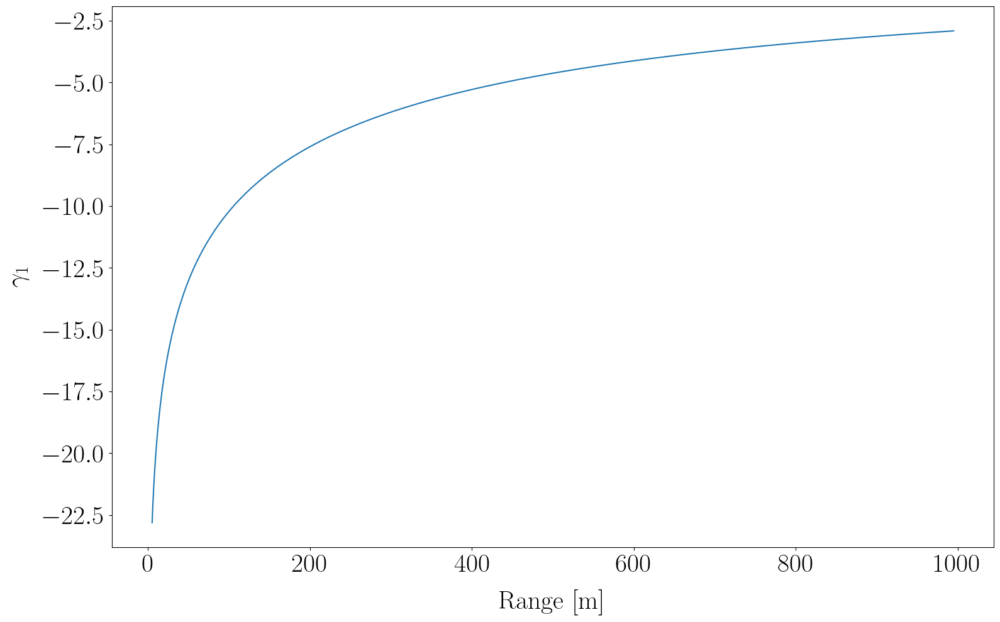

In [ ]:
# # Cas étudié
plt.figure()
plt.plot(r, gamma_1)
plt.xlabel("Range [m]")
plt.ylabel(r"$\gamma_1$")

# # Cas général
# r = np.linspace(10, 30000, 100000)
# g_r = 10 * np.log10(r  / (r + d_inter_rcv))
# plt.figure()
# plt.plot(r, g_r)

In [ ]:
# We can cas it to (f, r) shape 
from misc import cast_matrix_to_target_shape
gamma_1_extended = cast_matrix_to_target_shape(matrix=gamma_1, target_shape=rtf2_mod_2_log.shape) 

Text(0.02, 0.5, 'Range [m]')

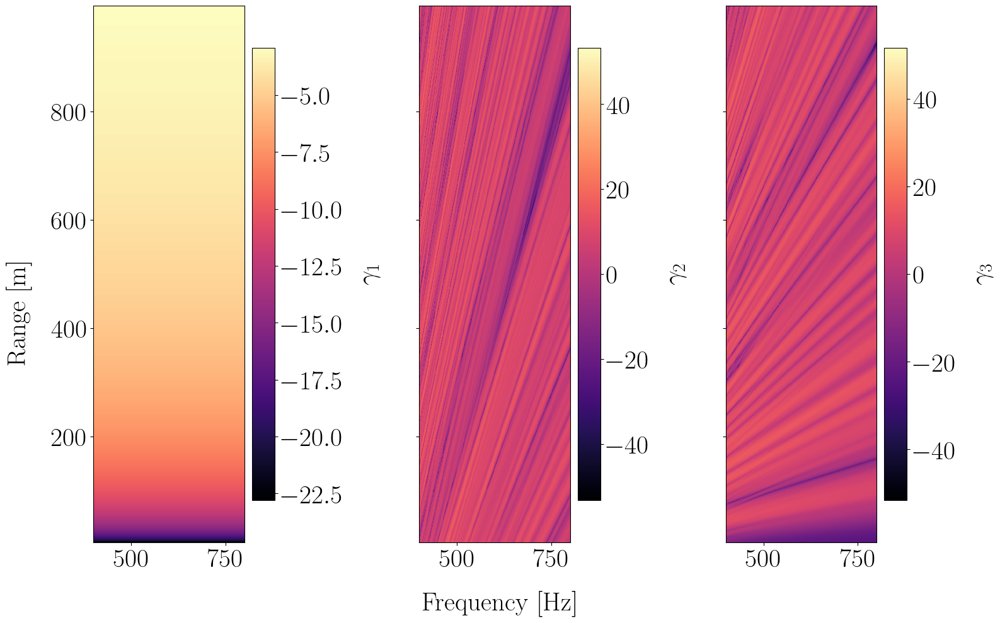

In [ ]:
fig, axs = plt.subplots(1, 3, sharey=True)
# gamma 1
im = axs[0].pcolormesh(f, r, gamma_1_extended.T, cmap="magma")
plt.colorbar(im, ax=axs[0], label=r"$\gamma_1$")
# gamma 2
gamma_2.plot(x="f", cmap="magma", cbar_kwargs={"label": r"$\gamma_2$"}, ax=axs[1])
# gamma 3
gamma_3.plot(x="f", cmap="magma", cbar_kwargs={"label": r"$\gamma_3$"}, ax=axs[2])

for ax in axs:
    ax.set_xlabel("")
    ax.set_ylabel("")

fig.supxlabel("Frequency [Hz]")
fig.supylabel("Range [m]")

Text(0.5, 1.0, '')

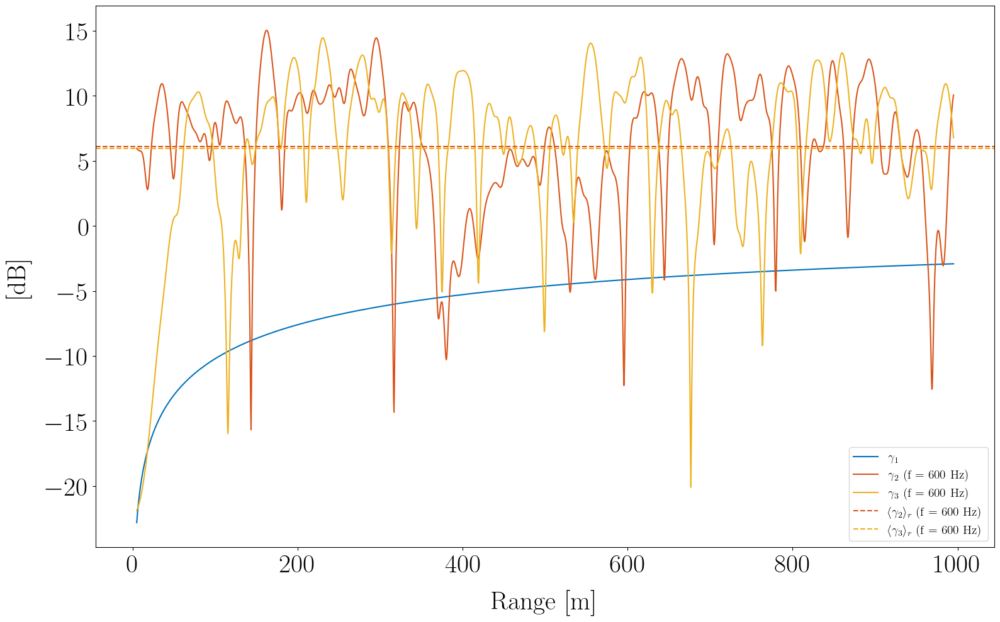

In [ ]:
# Comparaison à une fréquence donnée
f0 = 600
plt.figure()
plt.plot(r, gamma_1, label=r"$\gamma_1$", color=color(0))
gamma_2.sel(f=f0, method="nearest").plot(color=color(1), label=r"$\gamma_2$"+ f" (f = {f0} Hz)")
gamma_3.sel(f=f0, method="nearest").plot(color=color(2), label=r"$\gamma_3$"+ f" (f = {f0} Hz)")

plt.axhline(gamma_2.mean(dim="r").sel(f=f0, method="nearest"), color=color(1), linestyle="--", label=r"$\langle \gamma_2 \rangle_r$" + f" (f = {f0} Hz)")
plt.axhline(gamma_3.mean(dim="r").sel(f=f0, method="nearest"), color=color(2), linestyle="--", label=r"$\langle \gamma_3 \rangle_r$" + f" (f = {f0} Hz)")
plt.xlabel("Range [m]")
plt.ylabel("[dB]")
plt.legend()
plt.title("")

Text(0.5, 1.0, '')

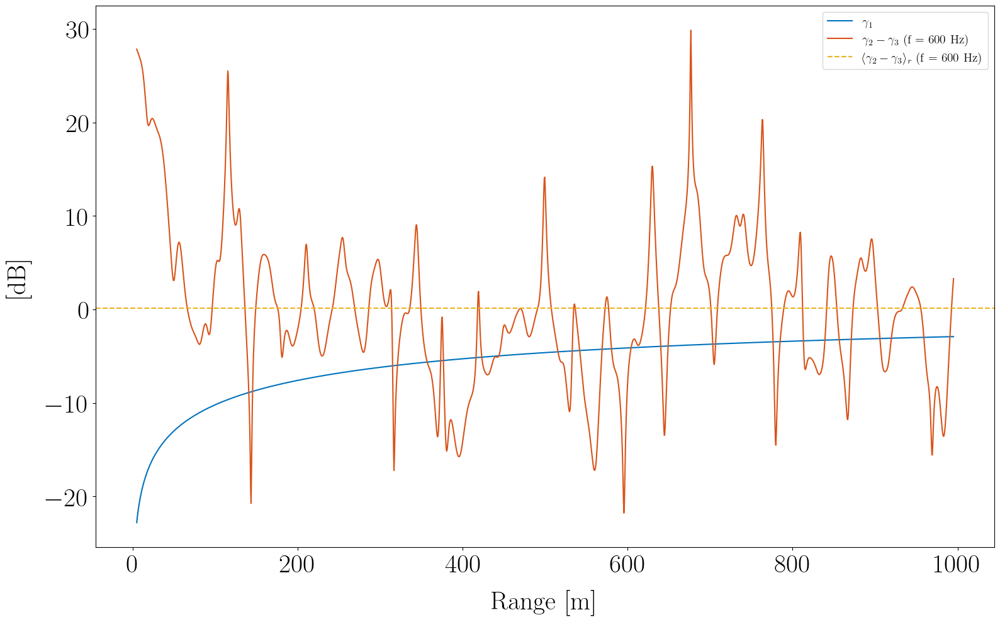

In [ ]:
# Comparaison à une fréquence donnée
f0 = 600
plt.figure()
plt.plot(r, gamma_1, label=r"$\gamma_1$", color=color(0))
gamma_23 = gamma_2 - gamma_3
gamma_23.sel(f=f0, method="nearest").plot(
    color=color(1), label=r"$\gamma_2 - \gamma_3$" + f" (f = {f0} Hz)"
)

plt.axhline(
    gamma_23.mean(dim="r").sel(f=f0, method="nearest"),
    color=color(2),
    linestyle="--",
    label=r"$\langle \gamma_2 - \gamma_3 \rangle_r$" + f" (f = {f0} Hz)",
)
plt.xlabel("Range [m]")
plt.ylabel("[dB]")
plt.legend()
plt.title("")

# Lien invariant de guide d'onde 

L'invariant de guide d'onde est défini par 

$$
\frac{d\omega}{dr} = \beta \frac{\omega}{r}
$$

où encore, 
$$
\frac{\omega}{\omega_0} =  \left (\frac{r}{r_0} \right )^{\beta}
$$

Par définition, 
Dans un guide d'onde idéal 
[1] Bonnel et al. - 2010 - Source localisation in deep water using waveguide invariant distribution ECUA 2010 
[2] Jensen et al. - 2011 - COA

In [ ]:
bottom_bc = "perfectly_rigid"
# bottom_bc = "pressure_release"
waveguide_depth = 100
d_inter_rcv = 950
z_rcv = 36
# src_ref_range = 1.15 * 1e3
src_ref_range = 1.5 * 1e3
z_src = 36
nrgrid = 2001
# delta_r = 250
delta_r = 1495
fmin = 25
fmax = 30
nfgrid = 500
distances = ["hermitian_angle"]

m = 3
ds = run_full_study(
    bottom_bc=bottom_bc,
    waveguide_depth=waveguide_depth,
    d_inter_rcv=d_inter_rcv,
    z_rcv=z_rcv,
    src_ref_range=src_ref_range,
    z_src=z_src,
    nrgrid=nrgrid,
    delta_r=delta_r,
    fmin=fmin,
    fmax=fmax,
    nfgrid=nfgrid,
    root_img=root_img,
    distances=distances,
    n_modes=m,
)
# I_1 = np.abs(4 * np.pi * ds.H1) ** 2
# I_2 = np.abs(4 * np.pi * ds.H2) ** 2


Number of propagating modes at fmin = 25 Hz : 3
Number of propagating modes at fmax = 30 Hz : 4
Computing RTF using  M = 3 modes (instead of all the propagating modes which are 4 at fmax)
Dataset computed


In [ ]:
I_1 = np.abs(4 * np.pi * ds.H1) ** 2
I_2 = np.abs(4 * np.pi * ds.H2) ** 2
I_1_dB = -10 * np.log10(I_1 + 1e-12)
I_2_dB = -10 * np.log10(I_2 + 1e-12)

rtf2_mod = ds.module.sel(h_index=2)
gamma = 10 * np.log10(rtf2_mod**2)

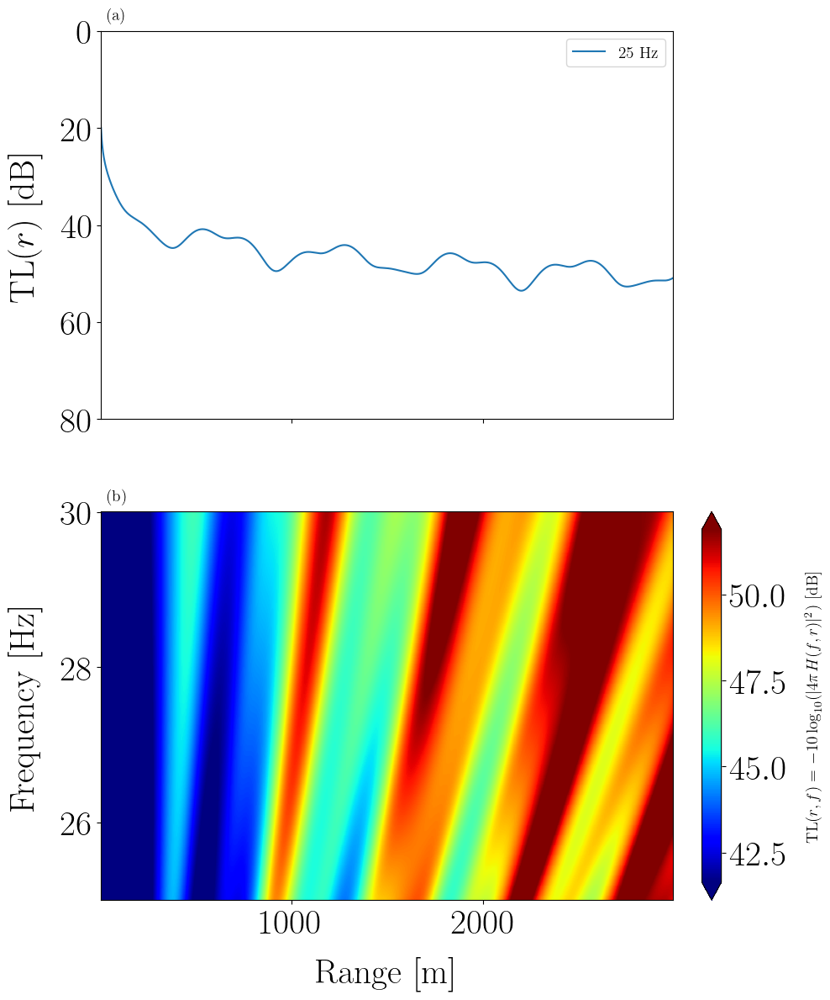

In [ ]:
plot_intensity(I_1_dB, fmin, fmax, step_f=10)

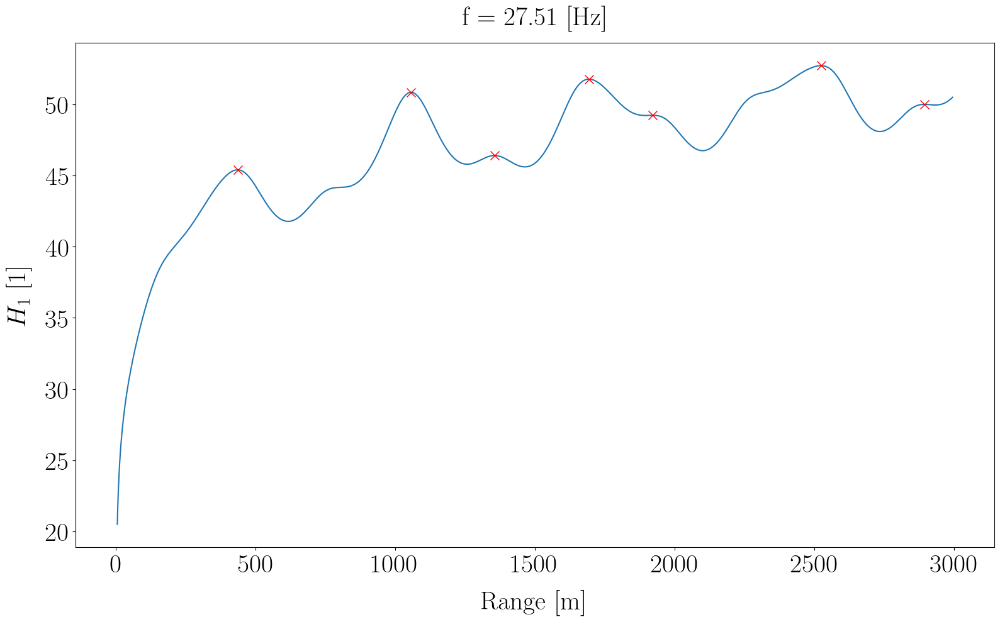

In [ ]:
f0 = (fmax - fmin)/2 + fmin
I_1_f0 = I_1_dB.sel(f=f0, method="nearest")
from scipy.signal import find_peaks
peaks, _ = find_peaks(I_1_f0.values, height=35)

r_00 = I_1_f0.r.values[peaks]
I_1_f0.plot()
plt.plot(r_00, I_1_f0.values[peaks], "x", label="Peaks", color="r", markersize=10)

In [ ]:
# Cos theta evaluation
f = ds.f.values
c = 1500
k = 2 * np.pi * f / c

from propa.ideal_waveguide import kr, kz
modes = np.arange(1, m + 1)

k_rms = [kr(modes[i_m], f, waveguide_depth, bottom_bc=bottom_bc) for i_m in range(m)]


Text(0, 0.5, '$\\beta = \\cos^2{\\theta_m}$')

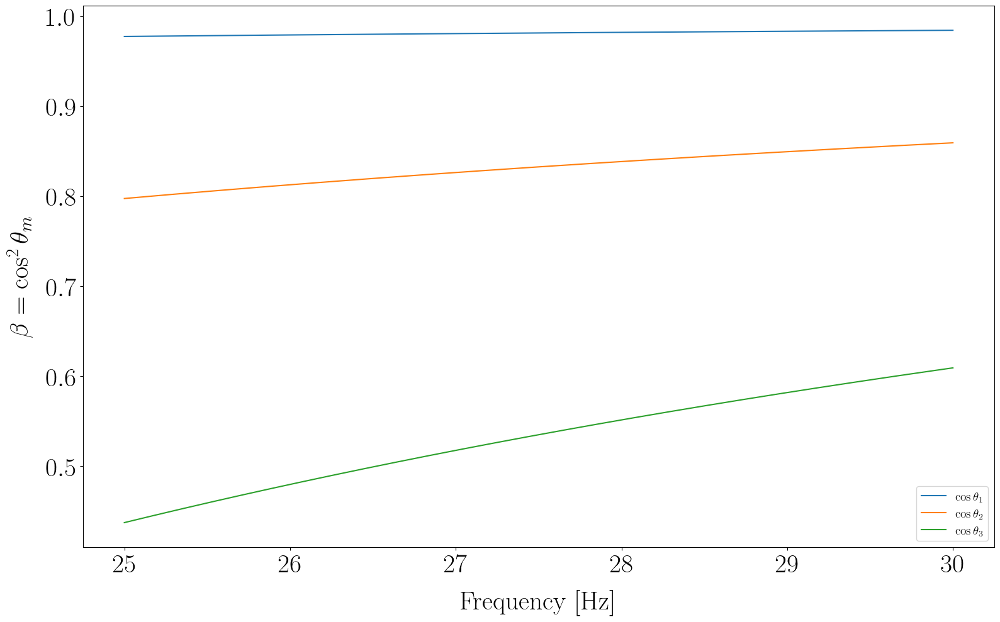

In [ ]:
plt.figure()
for i_m in range(m):
    k_rm = k_rms[i_m]
    cos_theta_m = k_rm / k
    plt.plot(f, cos_theta_m**2, label=rf"$\cos{{\theta_{{{modes[i_m]}}}}}$")

plt.legend()
plt.xlabel("Frequency [Hz]")
plt.ylabel(r"$\beta = \cos^2{\theta_m}$")

beta = 0.7812426935584138


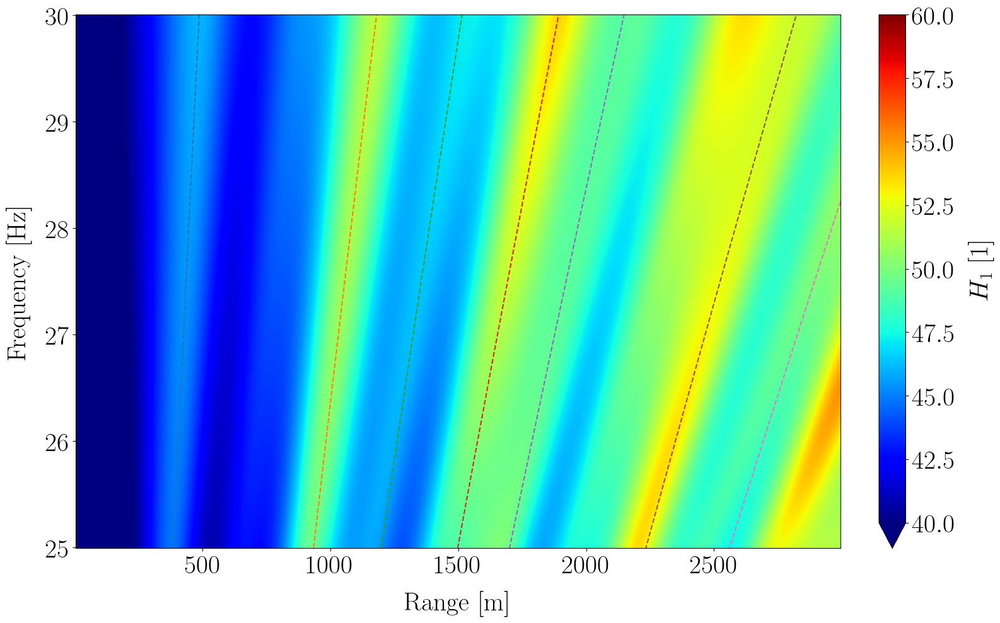

In [ ]:
beta = np.mean([(k_rm / k)**2 for k_rm in k_rms])
print(f"beta = {beta}")
r = ds.r.values 
I_1_dB.plot(x="r", y="f", cmap="jet", vmin=40, vmax=60)

# Add theoretical striation lines

for r_0 in r_00:

    f_striation = f0 * (r / r_0)**beta
    plt.plot(ds.r, f_striation, "--", label=f"Striation line for r={r_0:.1f} m")

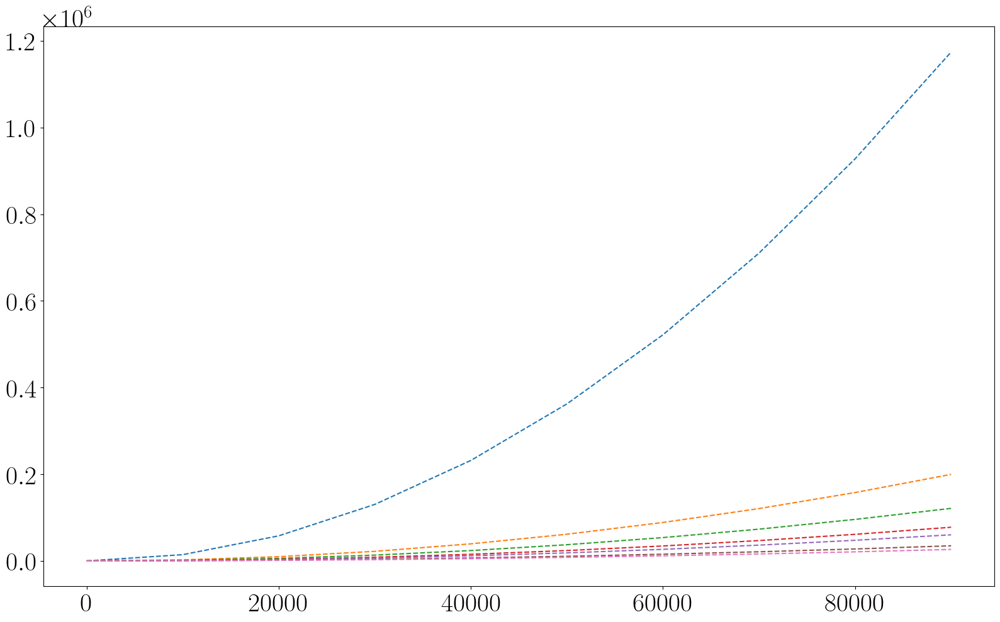

In [ ]:
r_ = np.arange(0, 100*1e3, 10000)
beta_ = 2
for r_0 in r_00:

    f_striation = f0 * (r_ / r_0) ** beta_
    plt.plot(r_, f_striation, "--", label=f"Striation line for r={r_0:.1f} m")

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

from skimage.data import shepp_logan_phantom
from skimage.transform import radon, rescale

# image = shepp_logan_phantom()
# image = rescale(image, scale=0.4, mode="reflect", channel_axis=None)

# # image = gamma_tilde_ega

# fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 4.5))

# ax1.set_title("Original")
# ax1.imshow(image, cmap=plt.cm.Greys_r)

# theta = np.linspace(0.0, 180.0, max(image.shape), endpoint=False)
# sinogram = radon(image, theta=theta)
# dx, dy = 0.5 * 180.0 / max(image.shape), 0.5 / sinogram.shape[0]
# ax2.set_title("Radon transform\n(Sinogram)")
# ax2.set_xlabel("Projection angle (deg)")
# ax2.set_ylabel("Projection position (pixels)")
# ax2.imshow(
#     sinogram,
#     cmap=plt.cm.Greys_r,
#     extent=(-dx, 180.0 + dx, -dy, sinogram.shape[0] + dy),
#     aspect="auto",
# )

# fig.tight_layout()
# plt.show()

### $I_1$

In [ ]:
image = I_1_dB.values
theta = np.linspace(0.0, 180.0, max(image.shape), endpoint=False)
sinogram_1 = radon(image, theta=theta)


c:\Users\baptiste.menetrier\.virtualenvs\phd-FBjz4hBd\Lib\site-packages\skimage\transform\radon_transform.py:74: UserWarning: Radon transform: image must be zero outside the reconstruction circle
  warn(


In [ ]:
sinogram_mod = np.copy(sinogram_1)
sinogram_mod[:, theta <= 10] = sinogram_1.min()
sinogram_mod[:, theta >= 170] = sinogram_1.min()
print(sinogram_mod.shape)
ind = np.unravel_index(np.argmax(sinogram_mod, axis=None), sinogram_1.shape)
ind

theta_I_1 = theta[ind[1]]
s_1 = ind[0]

(500, 2001)


C:\Users\baptiste.menetrier\AppData\Local\Temp\ipykernel_36932\1912792750.py:29: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


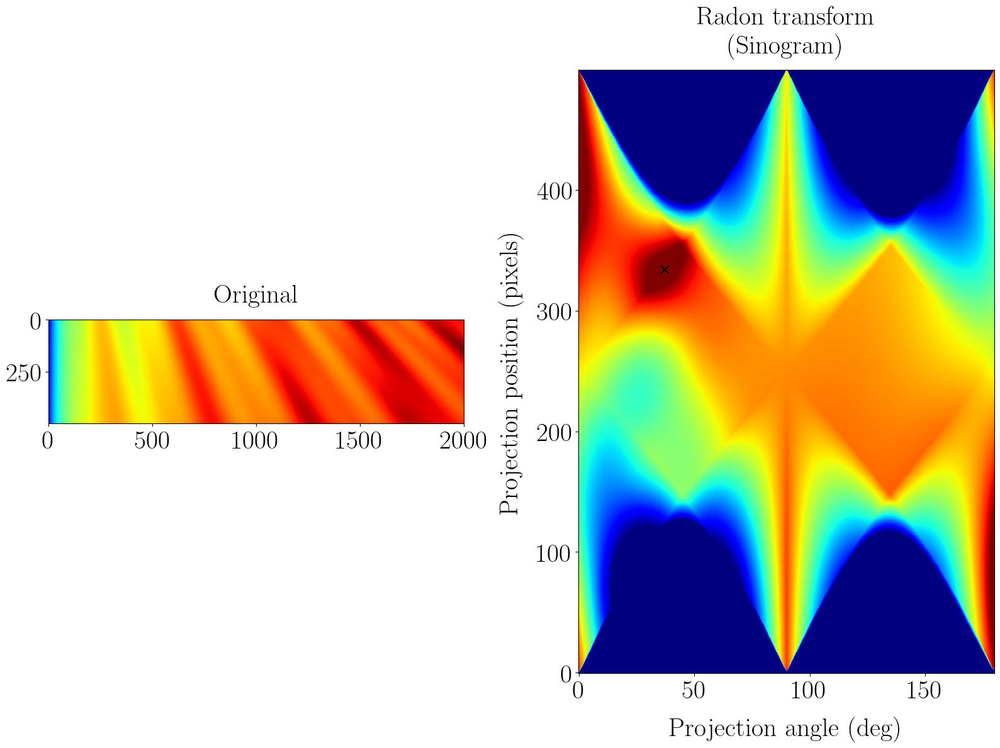

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 12))

ax1.set_title("Original")
ax1.imshow(image, cmap="jet")
dx, dy = 0.5 * 180.0 / max(image.shape), 0.5 / sinogram_1.shape[0]
ax2.set_title("Radon transform\n(Sinogram)")
ax2.set_xlabel("Projection angle (deg)")
ax2.set_ylabel("Projection position (pixels)")
vmin = np.percentile(sinogram_1, 30)
vmax = np.percentile(sinogram_1, 99)
# ax2.imshow(
#     sinogram,
#     cmap="jet",
#     extent=(-dx, 180.0 + dx, -dy, sinogram.shape[0] + dy),
#     aspect="auto",
#     vmin=vmin,
#     vmax=vmax,
# )
ax2.pcolormesh(
    theta,
    np.arange(sinogram_1.shape[0]),
    sinogram_1,
    cmap="jet",
    vmin=vmin,
    vmax=vmax,
)
plt.scatter(theta_I_1, ind[0], marker="x", color="k", s=100)

fig.tight_layout()
plt.show()

Text(0.5, 0, 'Projection angle (deg)')

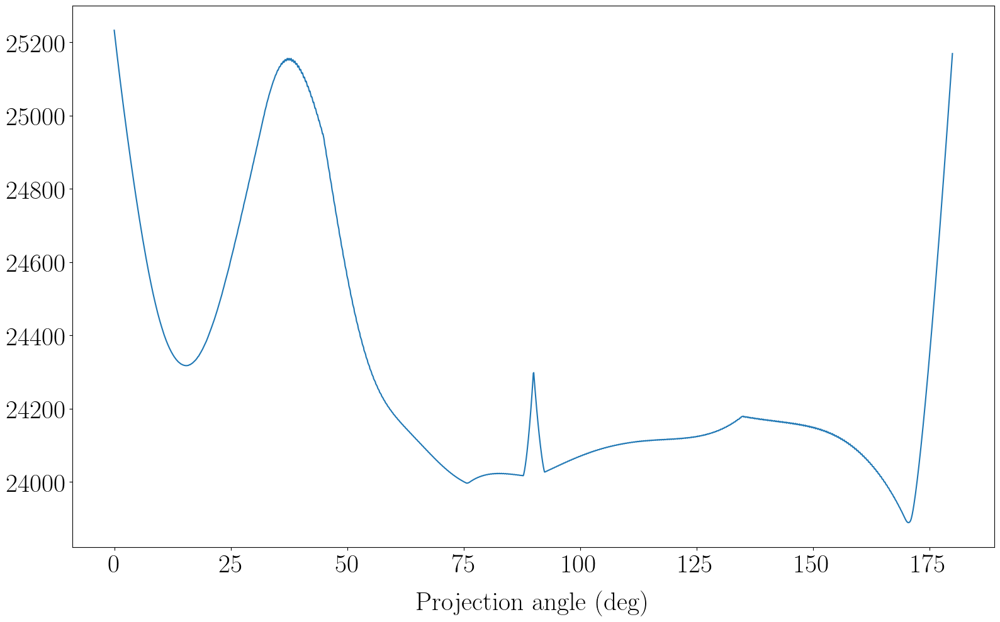

In [ ]:
sinogram_int = np.max(sinogram_1, axis=0)
plt.figure()
plt.plot(theta, sinogram_int)
plt.xlabel("Projection angle (deg)")

### $I_2$

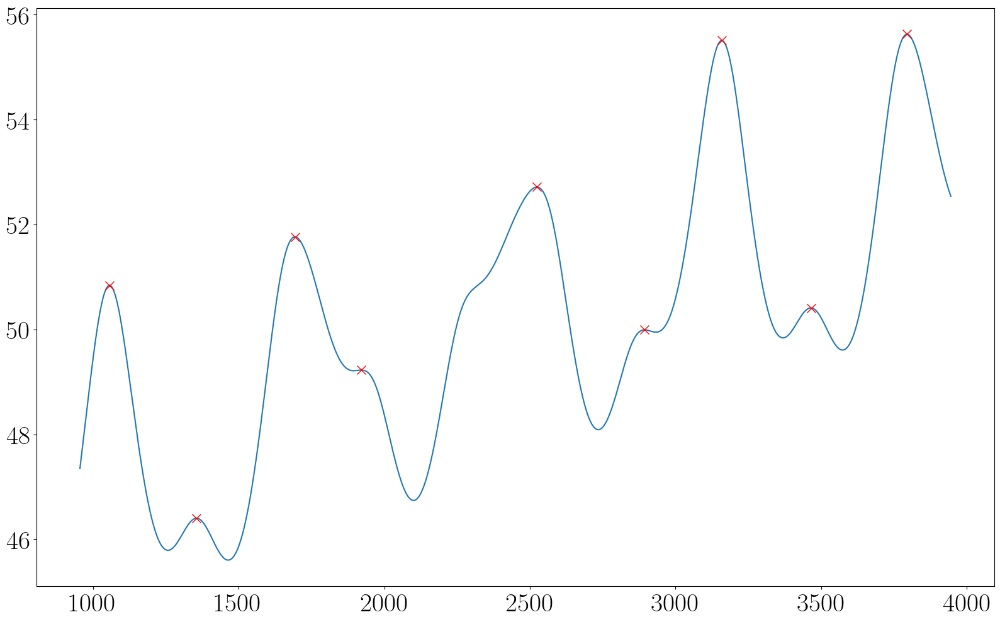

In [ ]:
I_2_f0 = I_2_dB.sel(f=f0, method="nearest")
peaks, _ = find_peaks(I_2_f0.values, height=35)

r = ds.r.values + d_inter_rcv

r_00 = r[peaks]
plt.plot(r, I_2_f0.values)
plt.plot(r_00, I_2_f0.values[peaks], "x", label="Peaks", color="r", markersize=10)

(25.0, 30.0)

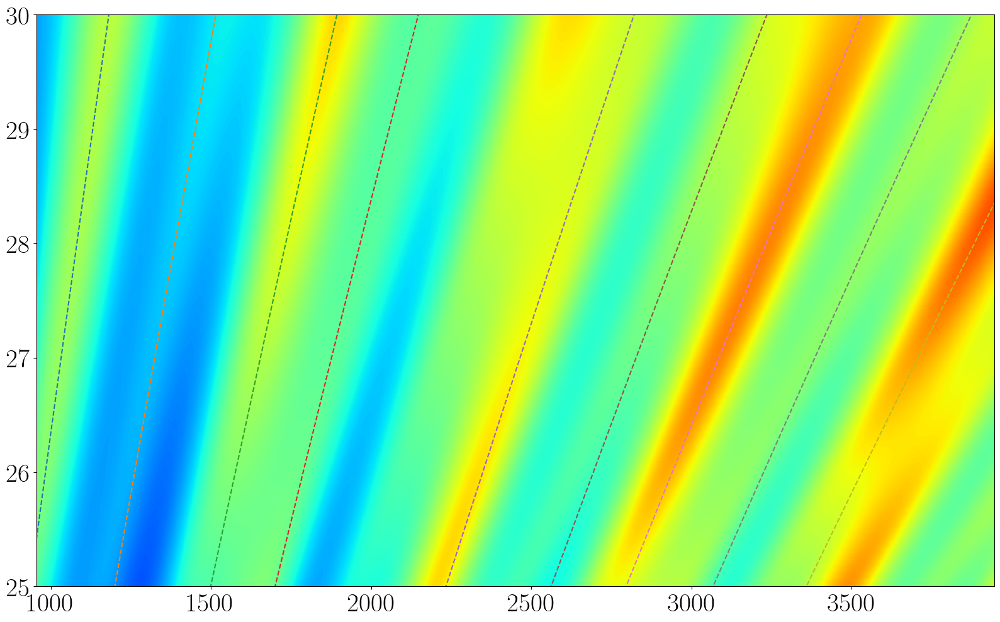

In [ ]:
# I_2_dB.plot(x="r", y="f", cmap="jet", vmin=40, vmax=60)
plt.pcolormesh(r, f, I_2_dB.values, cmap="jet", vmin=40, vmax=60)
# Add theoretical striation lines

for r_0 in r_00:

    f_striation = f0 * (r / r_0)**beta
    plt.plot(r, f_striation, "--", label=f"Striation line for r={r_0:.1f} m")

plt.xlim([r.min(), r.max()])
plt.ylim([f.min(), f.max()])

In [ ]:
image = I_2_dB.values
theta = np.linspace(0.0, 180.0, max(image.shape), endpoint=False)
sinogram_2 = radon(image, theta=theta)

In [ ]:
ind = np.unravel_index(np.argmax(sinogram_2, axis=None), sinogram_2.shape)
ind
theta_I_2 = theta[ind[1]]
s_2 = ind[0]

C:\Users\baptiste.menetrier\AppData\Local\Temp\ipykernel_36932\2378019338.py:28: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


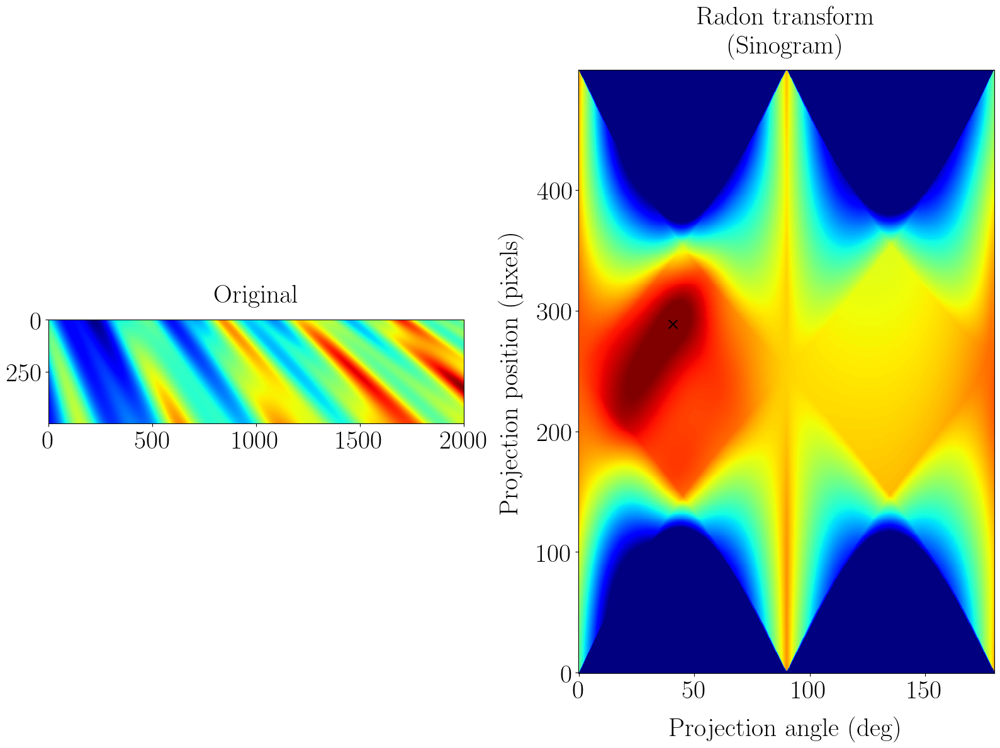

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 12))

ax1.set_title("Original")
ax1.imshow(image, cmap="jet")
dx, dy = 0.5 * 180.0 / max(image.shape), 0.5 / sinogram_2.shape[0]
ax2.set_title("Radon transform\n(Sinogram)")
ax2.set_xlabel("Projection angle (deg)")
ax2.set_ylabel("Projection position (pixels)")
vmin = np.percentile(sinogram_2, 30)
vmax = np.percentile(sinogram_2, 99)
ax2.pcolormesh(
    theta,
    np.arange(sinogram_2.shape[0]),
    sinogram_2,
    cmap="jet",
    vmin=vmin,
    vmax=vmax,
)
# ax2.imshow(
#     sinogram,
#     cmap="jet",
#     extent=(-dx, 180.0 + dx, -dy, sinogram.shape[0] + dy),
#     aspect="auto",
#     vmin=vmin,
#     vmax=vmax,
# )
plt.scatter(theta_I_2, s_2, marker="x", color="k", s=100)
fig.tight_layout()
plt.show()

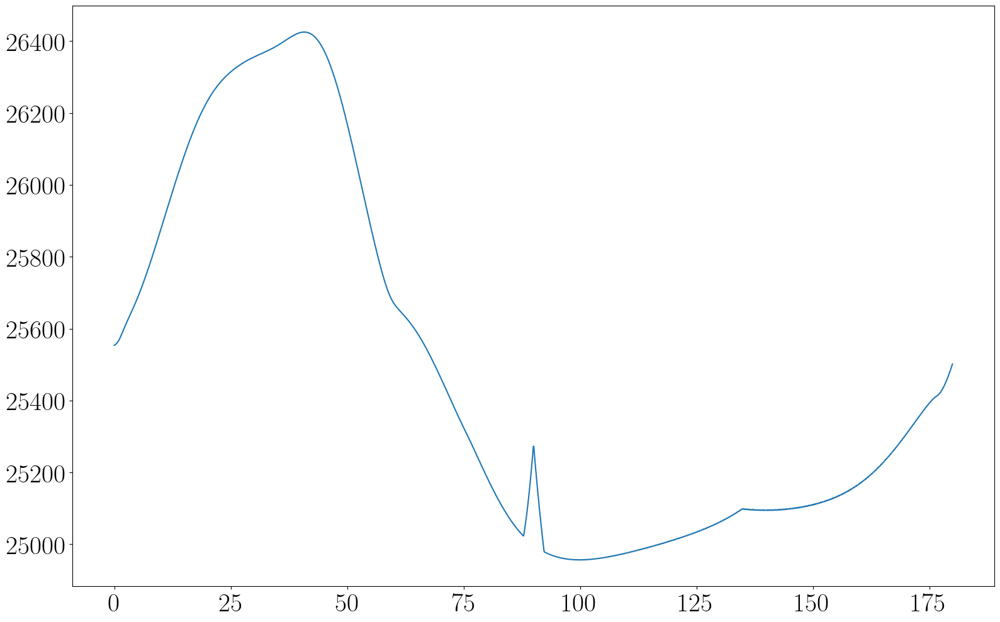

In [ ]:
sinogram_int = np.max(sinogram_2, axis=0)
plt.figure()
plt.plot(theta, sinogram_int)

### $\gamma$

In [ ]:
image = gamma.values
theta = np.linspace(0.0, 180.0, max(image.shape), endpoint=False)
sinogram_gamma = radon(image, theta=theta)

C:\Users\baptiste.menetrier\AppData\Local\Temp\ipykernel_36932\110456642.py:30: UserWarning: The figure layout has changed to tight
  fig.tight_layout()


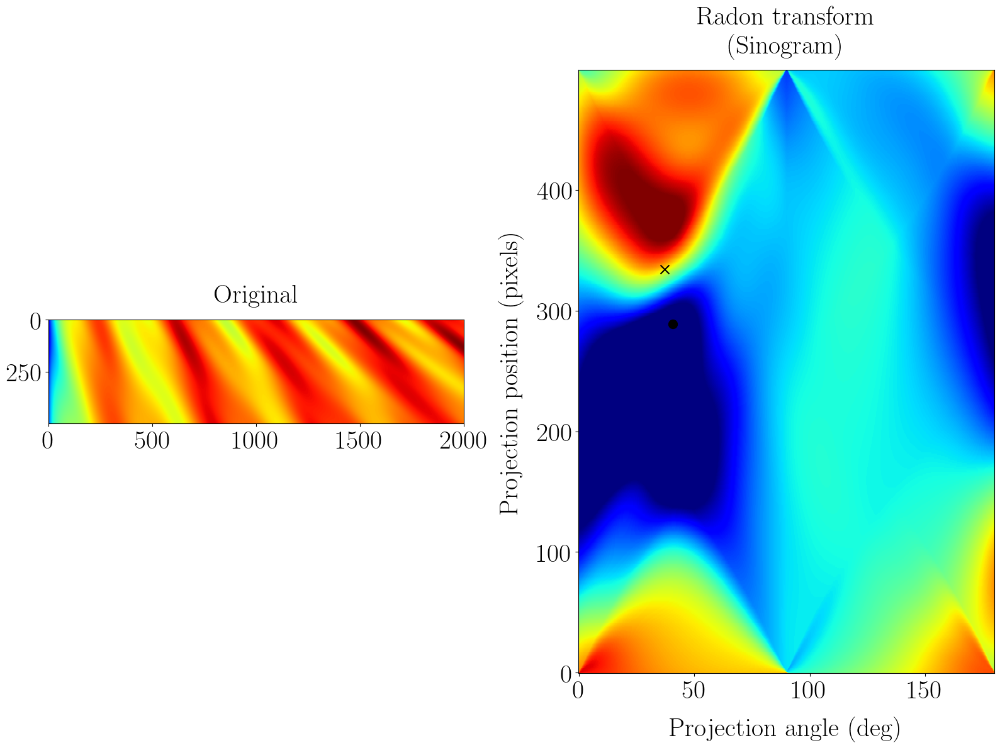

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 12))

ax1.set_title("Original")
ax1.imshow(image, cmap="jet")
dx, dy = 0.5 * 180.0 / max(image.shape), 0.5 / sinogram_gamma.shape[0]
ax2.set_title("Radon transform\n(Sinogram)")
ax2.set_xlabel("Projection angle (deg)")
ax2.set_ylabel("Projection position (pixels)")
vmin = np.percentile(sinogram_gamma, 10)
vmax = np.percentile(sinogram_gamma, 99)
# ax2.imshow(
#     sinogram,
#     cmap="jet",
#     extent=(-dx, 180.0 + dx, -dy, sinogram.shape[0] + dy),
#     aspect="auto",
#     vmin=vmin,
#     vmax=vmax,
# )
ax2.pcolormesh(
    theta,
    np.arange(sinogram_gamma.shape[0]),
    sinogram_gamma,
    cmap="jet",
    vmin=vmin,
    vmax=vmax,
)
plt.scatter(theta_I_1, s_1, marker="x", color="k", s=100)
plt.scatter(theta_I_2, s_2, marker="o", color="k", s=100)

fig.tight_layout()
plt.show()

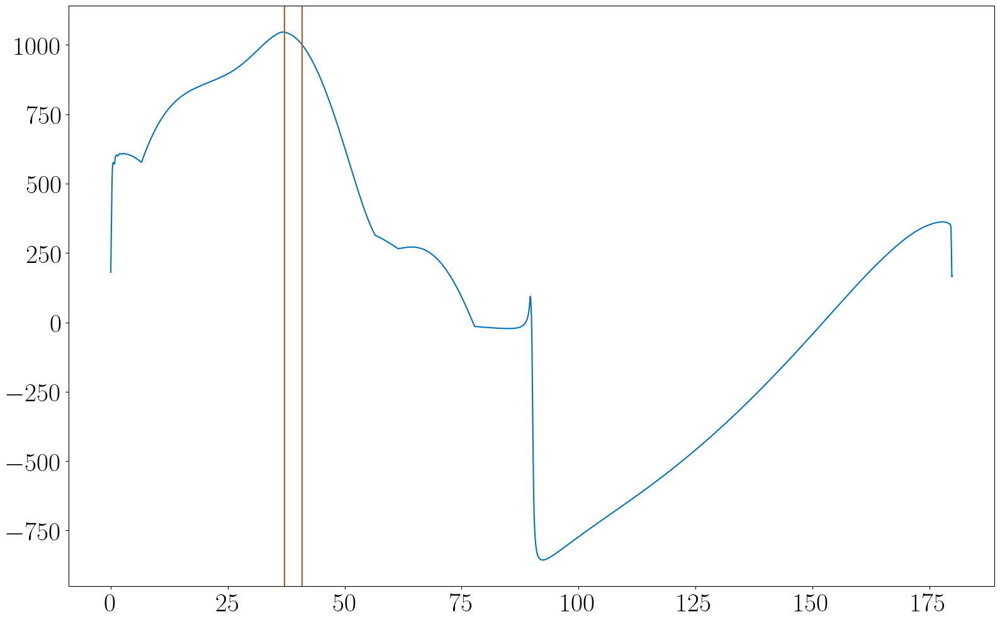

In [ ]:
plt.plot(theta, np.max(sinogram_gamma, axis=0), color=color(0))
plt.axvline(theta_I_1, color=color(1))
plt.axvline(theta_I_2, color=color(1))

In [ ]:
m = 16
ds = ds_dict[m]
r = ds.r.values
f = ds.f.values
rtf2_mod = ds.module.sel(h_index=2)
gamma = 10 * np.log10(rtf2_mod**2)

In [ ]:
gamma = gamma.sel(r=slice(200, 600))
image = gamma.values.T
theta = np.linspace(0.0, 180.0, max(image.shape), endpoint=False)
sinogram_gamma = radon(image, theta=theta)

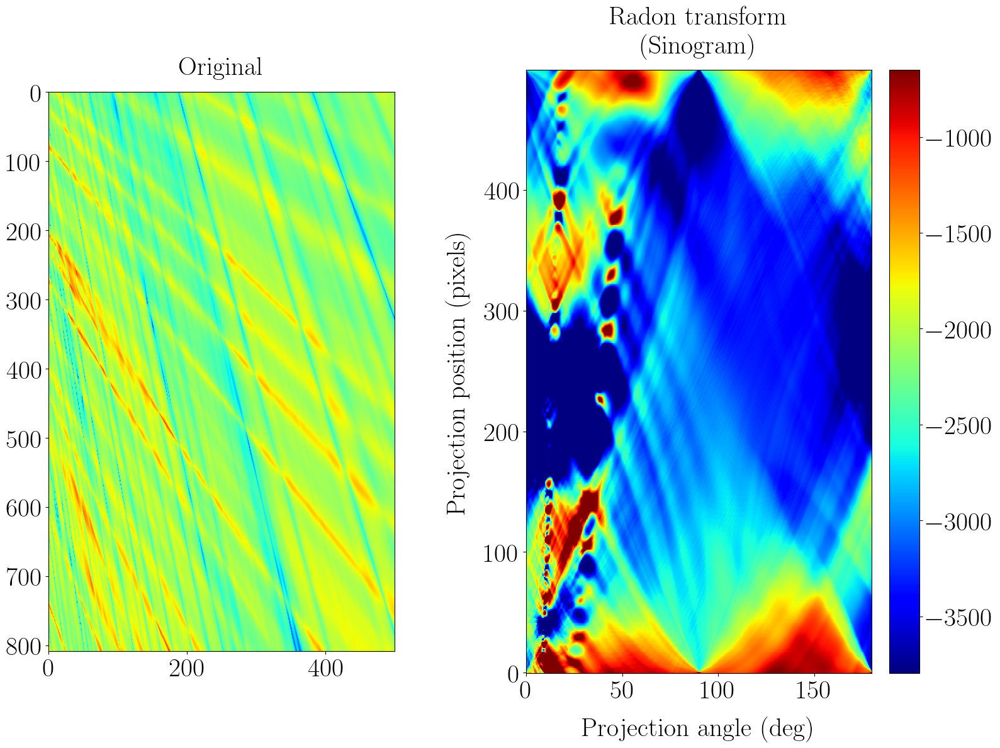

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 12))

ax1.set_title("Original")
ax1.imshow(image, cmap="jet")
dx, dy = 0.5 * 180.0 / max(image.shape), 0.5 / sinogram_gamma.shape[0]
ax2.set_title("Radon transform\n(Sinogram)")
ax2.set_xlabel("Projection angle (deg)")
ax2.set_ylabel("Projection position (pixels)")
vmin = np.percentile(sinogram_gamma, 10)
vmax = np.percentile(sinogram_gamma, 99)
# ax2.imshow(
#     sinogram,
#     cmap="jet",
#     extent=(-dx, 180.0 + dx, -dy, sinogram.shape[0] + dy),
#     aspect="auto",
#     vmin=vmin,
#     vmax=vmax,
# )

im = ax2.pcolormesh(
    theta,
    np.arange(sinogram_gamma.shape[0]),
    sinogram_gamma,
    cmap="jet",
    vmin=vmin,
    vmax=vmax,
)
plt.colorbar(im, ax=ax2)

# plt.scatter(theta_I_1, s_1, marker="x", color="k", s=100)
# plt.scatter(theta_I_2, s_2, marker="o", color="k", s=100)

plt.show()

809 500


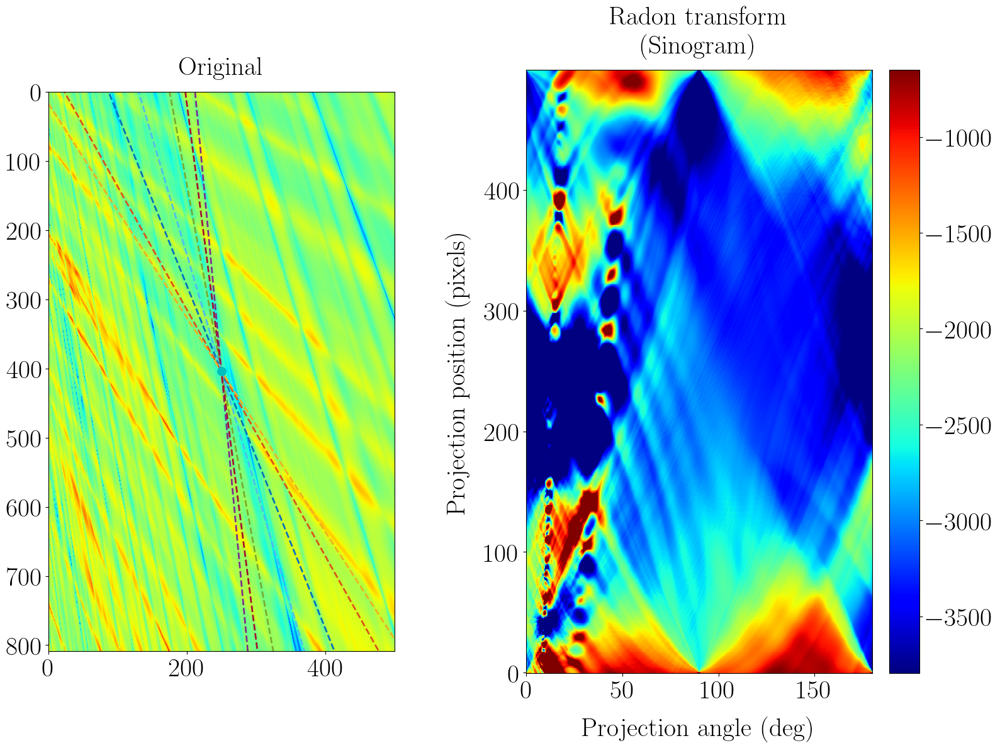

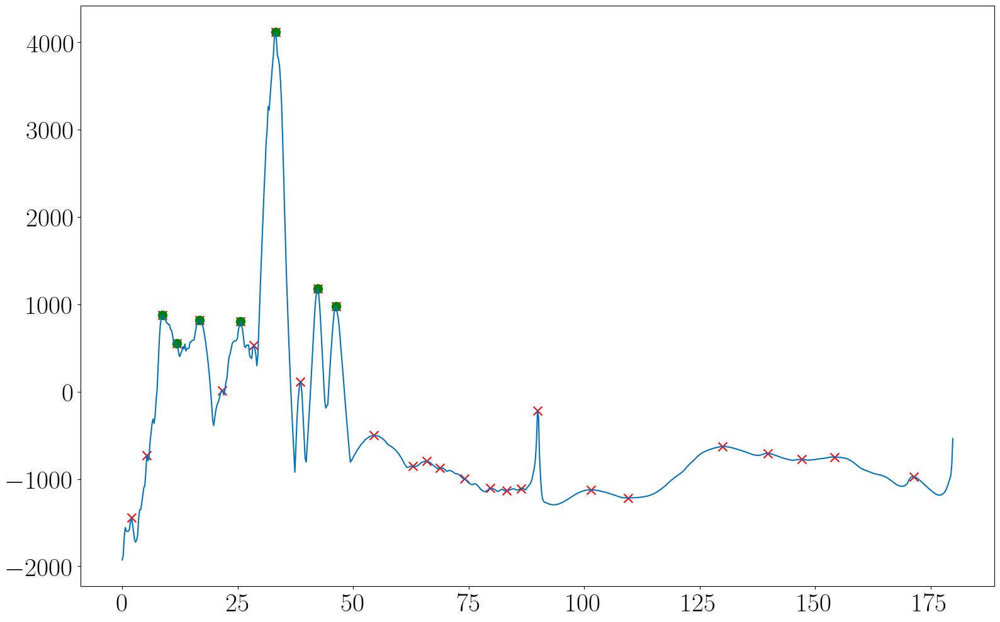

In [ ]:
sinogram_gamma_bin = np.copy(sinogram_gamma)
# sinogram_gamma_bin[sinogram_gamma < np.percentile(sinogram_gamma, 99)] = sinogram_gamma_bin.min()
# sinogram_gamma_bin[0:30, :] = (
#     sinogram_gamma_bin.min()
# )
# sinogram_gamma_bin[-30:, :] = sinogram_gamma_bin.min()

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 12))

ax1.set_title("Original")
ax1.imshow(image, cmap="jet", aspect="1")


dx, dy = 0.5 * 180.0 / max(image.shape), 0.5 / sinogram_gamma_bin.shape[0]
ax2.set_title("Radon transform\n(Sinogram)")
ax2.set_xlabel("Projection angle (deg)")
ax2.set_ylabel("Projection position (pixels)")
vmin = np.percentile(sinogram_gamma_bin, 10)
vmax = np.percentile(sinogram_gamma_bin, 99)

im = ax2.pcolormesh(
    theta,
    np.arange(sinogram_gamma_bin.shape[0]),
    sinogram_gamma_bin,
    cmap="jet",
    vmin=vmin,
    vmax=vmax,
)
plt.colorbar(im, ax=ax2)

theta_indicator = np.max(sinogram_gamma_bin, axis=0)
pos_indicator = np.max(sinogram_gamma_bin, axis=1)

from scipy.signal import find_peaks

dist_theta = 3
d_theta = theta[1] - theta[0]
dist_theta_sample = int(dist_theta / (d_theta))
peaks, _ = find_peaks(theta_indicator, distance=dist_theta_sample)

print(image.shape[0], image.shape[1])

peaks_ = peaks[theta[peaks] <= 90]
idx = np.argsort(theta_indicator[peaks_])[::-1]
peaks_ = peaks_[idx][:7]
for i, i_peak in enumerate(peaks_):
    # theta_line = sinogram_gamma_bin[:, i_peak]
    # plt.figure()
    # plt.plot(theta_line)
    phi_1 = theta[i_peak] * np.pi / 180 
    # phi_1 = 50 * np.pi / 180
    a = 1 / np.tan(phi_1) * image.shape[0] / image.shape[1]
    # # b = r_0 - a * f0
    # # r_phi_1 = a * f + b

    r_line = np.arange(image.shape[1])
    f_line = np.arange(image.shape[0])
    # # Pick middle of the image to draw line
    f0 = f_line[f_line.size // 2]
    r0 = r_line[r_line.size // 2]
    b = f0 - a * r0
    f_phi_1 = a * r_line + b
    # # print(phi_1, a, r_0, f0)
    ax1.plot(r_line, f_phi_1, "--", color=color(i), linewidth=2)
    ax1.scatter(r0, f0, color="c", s=80, zorder=10)

ax1.set_xlim(0, image.shape[1])
ax1.set_ylim(image.shape[0], 0 )

plt.figure()
plt.plot(theta, theta_indicator, color=color(0))
plt.scatter(theta[peaks], theta_indicator[peaks], color="r", s=100, marker="x")
plt.scatter(theta[peaks_], theta_indicator[peaks_], color="g", s=100, marker="o")
# plt.figure()

# plt.plot(theta, np.max(sinogram_gamma_bin, axis=0), color=color(0))